# **CNN & EfficientNet-B0**

In this notebook I build a deep learning pipeline to classify retinal OCT images into three categories: AMD, DME, and Normal. I start from the raw patient level data and walk through the full workflow, including preprocessing, patient aware splitting, transfer learning with EfficientNet B0, a lightweight custom CNN baseline, and finally evaluation with Grad-CAM explainability.

--------------------------

&nbsp;

## **0. Input Libraries**

In [67]:
!pip install grad-cam

In [68]:
# Standard library
import os, glob, random, warnings, json, shutil
from pathlib import Path
from collections import Counter, defaultdict
import scipy.stats

# Data
import numpy as np
import pandas as pd
from PIL import Image
from tqdm import tqdm
from concurrent.futures import ThreadPoolExecutor
from scipy.stats import entropy as scipy_entropy

# Visualisation
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns
from IPython.display import clear_output

# Image feature extraction
from skimage.feature import hog, local_binary_pattern
from skimage.transform import resize as sk_resize
from skimage.color import rgb2gray

# Scikit-learn: models
from sklearn.model_selection import train_test_split, StratifiedGroupKFold
from sklearn.preprocessing import StandardScaler, LabelEncoder, label_binarize
from sklearn.utils.class_weight import compute_class_weight
from sklearn.pipeline import Pipeline
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.calibration import calibration_curve
from sklearn.utils import resample

# Scikit-learn: metrics
from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    ConfusionMatrixDisplay,
    roc_curve,
    auc,
    roc_auc_score
)


# PyTorch
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as T
from torchvision.models import efficientnet_b0, EfficientNet_B0_Weights
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image


warnings.filterwarnings('ignore')

In [69]:
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

G = torch.Generator()
G.manual_seed(SEED)

def seed_worker(worker_id):
    np.random.seed(SEED + worker_id)
    random.seed(SEED + worker_id)

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Using device: {DEVICE}')

Using device: cuda


-------------------------

&nbsp;

## **1. Data Loading**

While exploring the dataset I found 117 fundus photography images (768×768 pixels) mixed in with the OCT B-scans (496×512 pixels). These come from a completely different imaging modality, so I filtered them out based on the resolution mismatch. After this cleanup, 3,231 valid OCT images remain for training and evaluation.

In [70]:
DATASET_DIR = '/kaggle/input/datasets/susannamazzocchi/rasti-images/rasti_images'
imgs = glob.glob(DATASET_DIR + "/**/*.*", recursive=True)
imgs = [f for f in imgs if f.lower().endswith(('.png', '.jpg', '.jpeg', '.tiff'))]
print(f"Total valid images found: {len(imgs)}")

Total valid images found: 3348


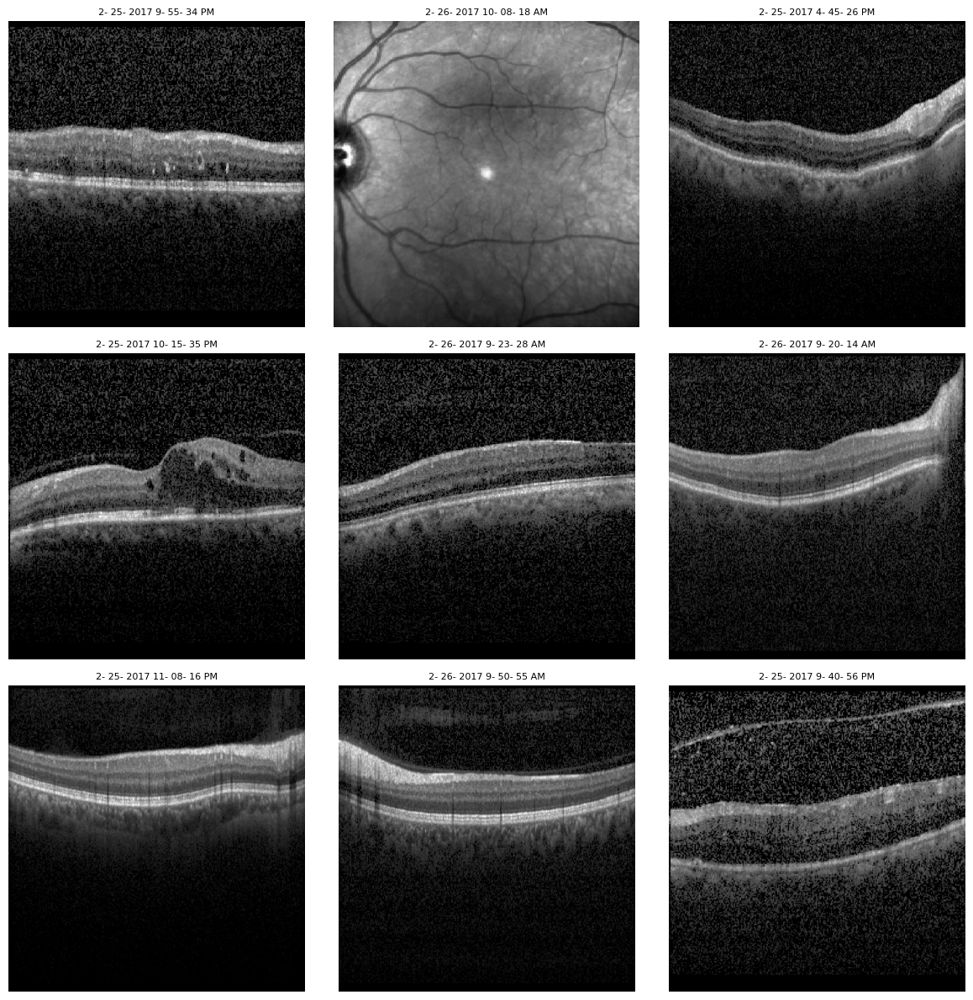

In [71]:
sample = random.sample(imgs, 9)
fig, axes = plt.subplots(3, 3, figsize=(12, 12))
for ax, path in zip(axes.flatten(), sample):
    img = Image.open(path)
    ax.imshow(img, cmap='gray')
    ax.set_title(Path(path).parent.name, fontsize=8)
    ax.axis('off')
plt.tight_layout()
plt.show()

In [72]:
imgs_raw = glob.glob(DATASET_DIR + '/**/*.*', recursive=True)
imgs_raw = [f for f in imgs_raw if f.lower().endswith(('.png', '.jpg', '.jpeg', '.tiff'))]

outliers = []
for p in imgs_raw:
    with Image.open(p) as img:
        w, h = img.size
        if (w, h) != (496, 512):
            outliers.append((w, h, p))

print(f'Images with size different from 496x512: {len(outliers)}')
for w, h, p in outliers[:10]:
    print(f'  {w}x{h}  {Path(p).parent.name}/{Path(p).name}')

Images with size different from 496x512: 117
  768x768  2- 25- 2017 4- 44- 26 PM/Image 0.TIFF
  768x768  2- 25- 2017 9- 27- 53 PM/Image 0.TIFF
  768x768  2- 25- 2017 4- 48- 43 PM/Image 0.TIFF
  768x768  2- 25- 2017 9- 10- 42 PM/Image 0.TIFF
  768x768  2- 25- 2017 4- 45- 26 PM/Image 0.TIFF
  768x768  2- 26- 2017 9- 48- 11 AM/Image 0.TIFF
  768x768  2- 26- 2017 10- 03- 02 AM/Image 0.TIFF
  768x768  2- 26- 2017 10- 20- 30 AM/Image 0.TIFF
  768x768  2- 26- 2017 10- 21- 43 AM/Image 0.TIFF
  768x768  2- 26- 2017 9- 49- 50 AM/Image 0.TIFF


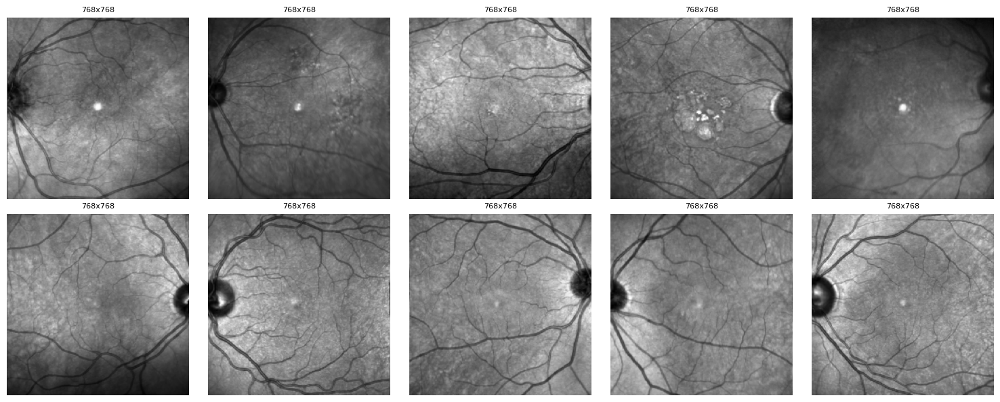

In [73]:
fig, axes = plt.subplots(2, 5, figsize=(15, 6))
for ax, (w, h, p) in zip(axes.flatten(), outliers[:10]):
    img = Image.open(p)
    ax.imshow(img, cmap='gray')
    ax.set_title(f'{w}x{h}', fontsize=8)
    ax.axis('off')
plt.tight_layout()
plt.show()

In [74]:
def is_oct_fast(path):
    try:
        with Image.open(path) as img:
            w, h = img.size
            ratio = w / h
            return 0.8 < ratio < 1.2
    except:
        return False

with ThreadPoolExecutor(max_workers=8) as executor:
    mask = list(executor.map(is_oct_fast, imgs_raw))

imgs = [p for p in imgs_raw 
        if p.lower().endswith(('.png', '.jpg', '.jpeg', '.tiff'))
        and Image.open(p).size == (496, 512)]

print(f'Total: {len(imgs_raw)}  →  After filtering: {len(imgs)}')

Total: 3348  →  After filtering: 3231


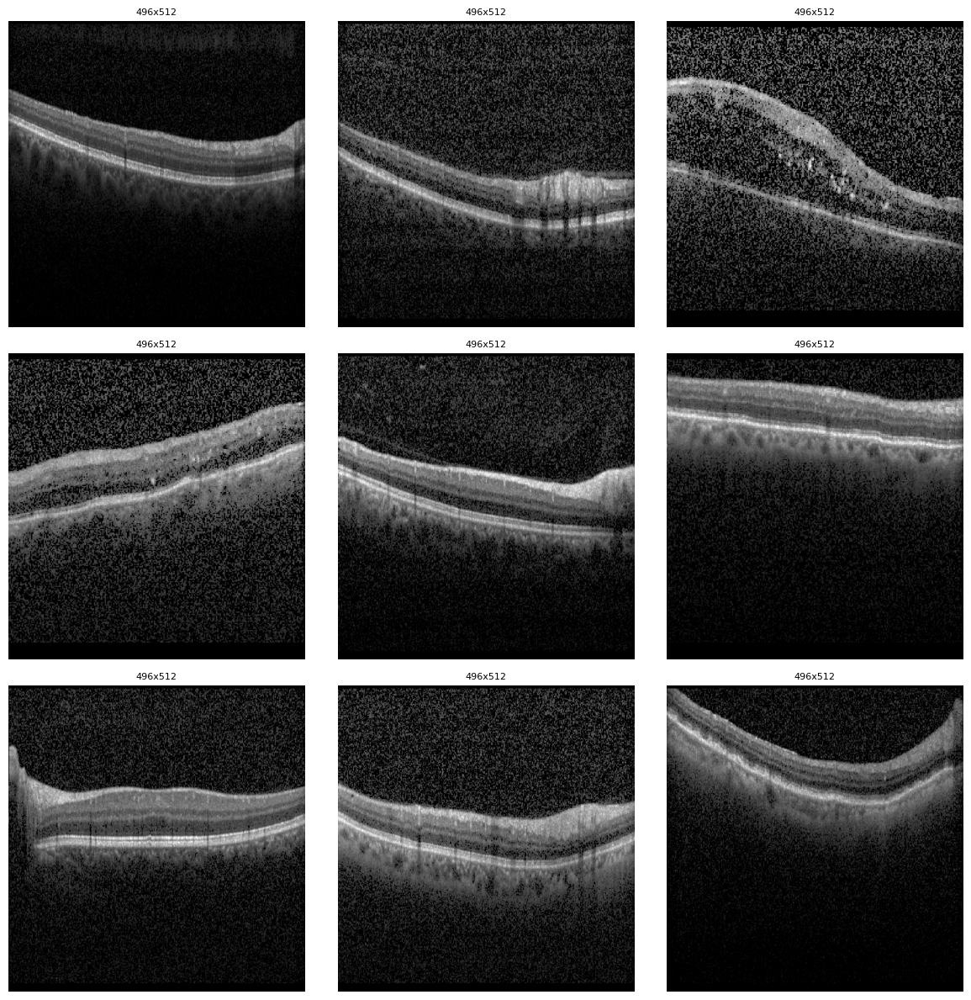

In [75]:
sample = random.sample(imgs, 9)
fig, axes = plt.subplots(3, 3, figsize=(12, 12))
for ax, path in zip(axes.flatten(), sample):
    with Image.open(path) as img:
        w, h = img.size
    ax.imshow(Image.open(path), cmap='gray')
    ax.set_title(f'{w}x{h}', fontsize=8)
    ax.axis('off')
plt.tight_layout()
plt.show()

In [76]:
dati_filtered = []
for path in imgs:
    p = Path(path)
    parts = p.relative_to(DATASET_DIR).parts
    if len(parts) >= 2:
        raw_label = parts[0]
        patient_id = parts[1]
        label_clean = raw_label.replace(' Part1', '').replace(' Part2', '')
        dati_filtered.append({'label': label_clean, 'patient_id': patient_id})

df_filtered = pd.DataFrame(dati_filtered)

summary = (
    df_filtered.groupby('label')
    .agg(
        Patients=('patient_id', 'nunique'),
        Images=('patient_id', 'count')
    )
    .reset_index()
    .rename(columns={'label': 'Class'})
)
summary['Img / Patient'] = (summary['Images'] / summary['Patients']).round(1)
summary['Share (%)'] = (summary['Images'] / summary['Images'].sum() * 100).round(1)

totale = pd.DataFrame([{
    'Class': 'Total',
    'Patients': summary['Patients'].sum(),
    'Images': summary['Images'].sum(),
    'Img / Patient': round(summary['Images'].sum() / summary['Patients'].sum(), 1),
    'Share (%)': 100.0
}])
summary_final = pd.concat([summary, totale], ignore_index=True)

format_dict = {
    'Patients': '{:d}',
    'Images': '{:,}',
    'Img / Patient': '{:.1f}',
    'Share (%)': '{:.1f}'
}

display(
    summary_final.style
    .set_caption('OCT5k Dataset: composition after filtering (496×512)')
    .format(format_dict)
    .set_properties(**{'text-align': 'center'})
    .set_table_styles([
        {'selector': 'caption', 'props': [('font-weight', 'bold'), ('font-size', '13px')]},
        {'selector': 'th', 'props': [('background-color', '#f0f0f0'), ('font-weight', 'bold')]},
    ])
    .apply(lambda x: ['background-color: #e8f4e8; font-weight: bold'
                       if x['Class'] == 'Total' else '' for _ in x], axis=1)
    .hide(axis='index')
)

Class,Patients,Images,Img / Patient,Share (%)
AMD,18,486,27.0,15.0
DME,49,"1,117",22.8,34.6
Normal,50,"1,628",32.6,50.4
Total,117,"3,231",27.6,100.0


### ***Dataset Initialization & Summary Table***

In [77]:
data = {
    'Category': ['AMD', 'DME', 'Normal'],
    'Patients': [18, 49, 50],
    'Images':   [486, 1117, 1628]
}
df_summary = pd.DataFrame(data)
df_summary['Images_per_Patient'] = (df_summary['Images'] / df_summary['Patients']).round(1)
df_summary['Share (%)'] = (df_summary['Images'] / df_summary['Images'].sum() * 100).round(1)

totals = pd.DataFrame([{
    'Category':         'Total',
    'Patients':         df_summary['Patients'].sum(),
    'Images':           df_summary['Images'].sum(),
    'Images_per_Patient': round(df_summary['Images'].sum() / df_summary['Patients'].sum(), 1),
    'Share (%)':        100.0
}])
df = pd.concat([df_summary, totals], ignore_index=True)
display(df_summary)

,Category,Patients,Images,Images_per_Patient,Share (%)
0,AMD,18,486,27.0,15.0
1,DME,49,1117,22.8,34.6
2,Normal,50,1628,32.6,50.4


### ***Patients Distribution by Category***

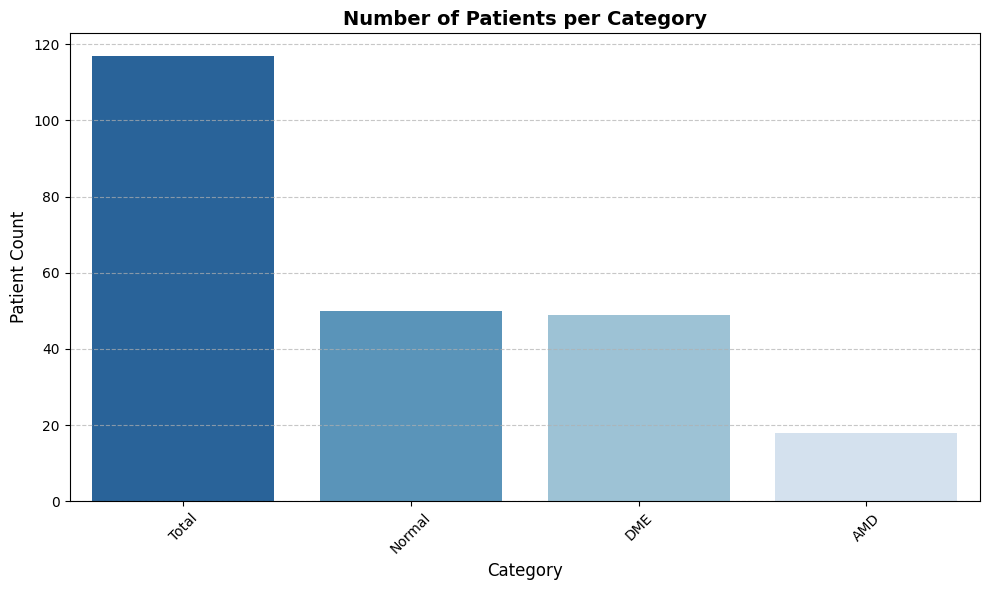

In [78]:
plt.figure(figsize=(10, 6))
sns.barplot(data=df.sort_values('Patients', ascending=False), x='Category', y='Patients', palette='Blues_r')
plt.title('Number of Patients per Category', fontsize=14, fontweight='bold')
plt.xlabel('Category', fontsize=12)
plt.ylabel('Patient Count', fontsize=12)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

### ***Images Distribution by Category***

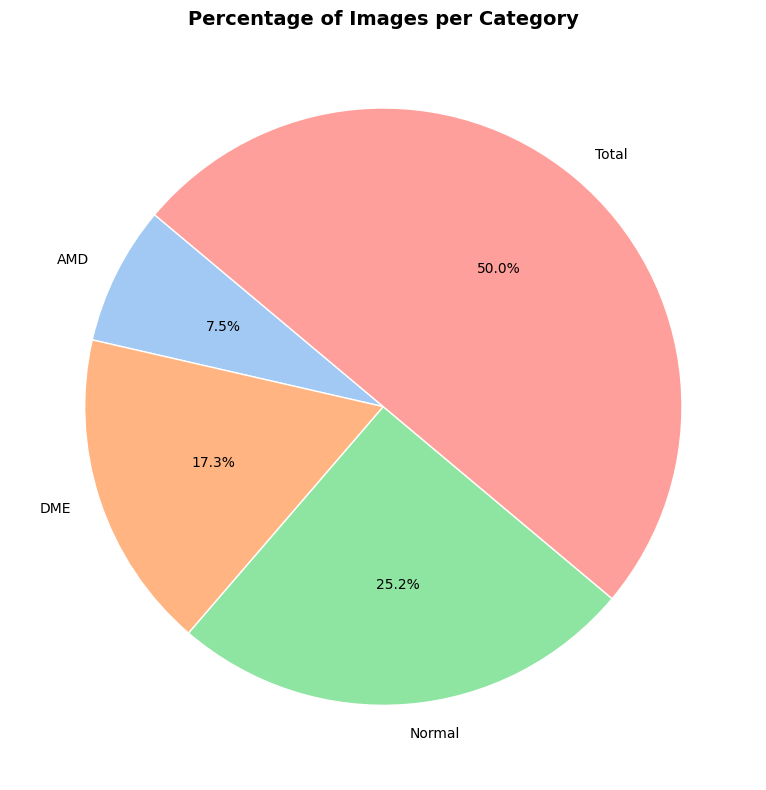

In [79]:
plt.figure(figsize=(8, 8))
colors = sns.color_palette('pastel')[0:len(df)]
plt.pie(df['Images'], labels=df['Category'], autopct='%1.1f%%', startangle=140, colors=colors, wedgeprops={'edgecolor': 'white'})
plt.title('Percentage of Images per Category', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

### ***Average Images per Patient Ratio***

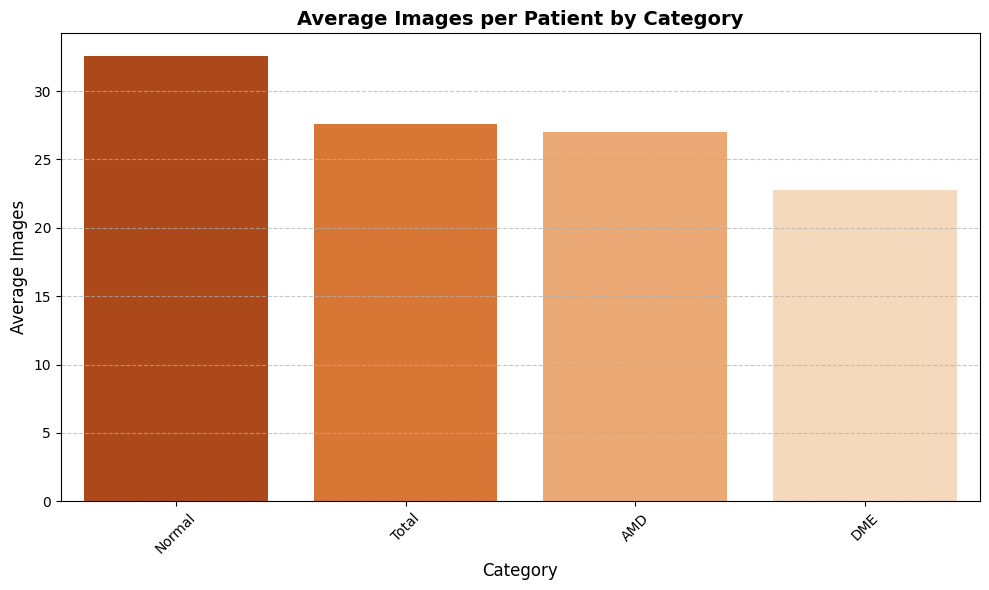

In [80]:
plt.figure(figsize=(10, 6))
sns.barplot(data=df.sort_values('Images_per_Patient', ascending=False), x='Category', y='Images_per_Patient', palette='Oranges_r')
plt.title('Average Images per Patient by Category', fontsize=14, fontweight='bold')
plt.xlabel('Category', fontsize=12)
plt.ylabel('Average Images', fontsize=12)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

### ***Aggregated Analysis: Pathologies vs Normal***

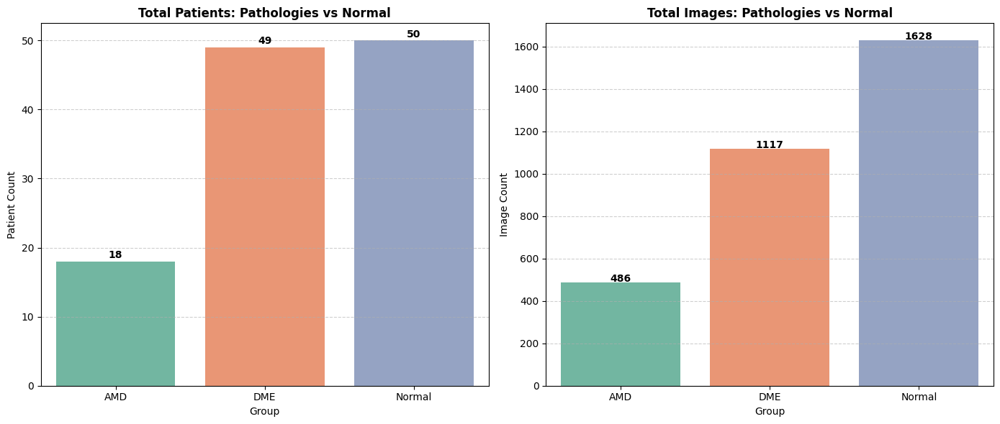

In [81]:
agg_data = {
    'Group': ['AMD', 'DME', 'Normal'],
    'Patients': [18, 49, 50],
    'Images': [486, 1117, 1628]
}
df_agg = pd.DataFrame(agg_data)

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

sns.barplot(data=df_agg, x='Group', y='Patients', palette='Set2', ax=axes[0])
axes[0].set_title('Total Patients: Pathologies vs Normal', fontsize=12, fontweight='bold')
axes[0].set_ylabel('Patient Count')
axes[0].grid(axis='y', linestyle='--', alpha=0.6)
for bar, v in zip(axes[0].patches, df_agg['Patients']):
    axes[0].text(bar.get_x() + bar.get_width()/2, v + 0.5, str(v),
                 ha='center', fontsize=10, fontweight='bold')

sns.barplot(data=df_agg, x='Group', y='Images', palette='Set2', ax=axes[1])
axes[1].set_title('Total Images: Pathologies vs Normal', fontsize=12, fontweight='bold')
axes[1].set_ylabel('Image Count')
axes[1].grid(axis='y', linestyle='--', alpha=0.6)
for bar, v in zip(axes[1].patches, df_agg['Images']):
    axes[1].text(bar.get_x() + bar.get_width()/2, v + 5, str(v),
                 ha='center', fontsize=10, fontweight='bold')

plt.tight_layout()
plt.show()

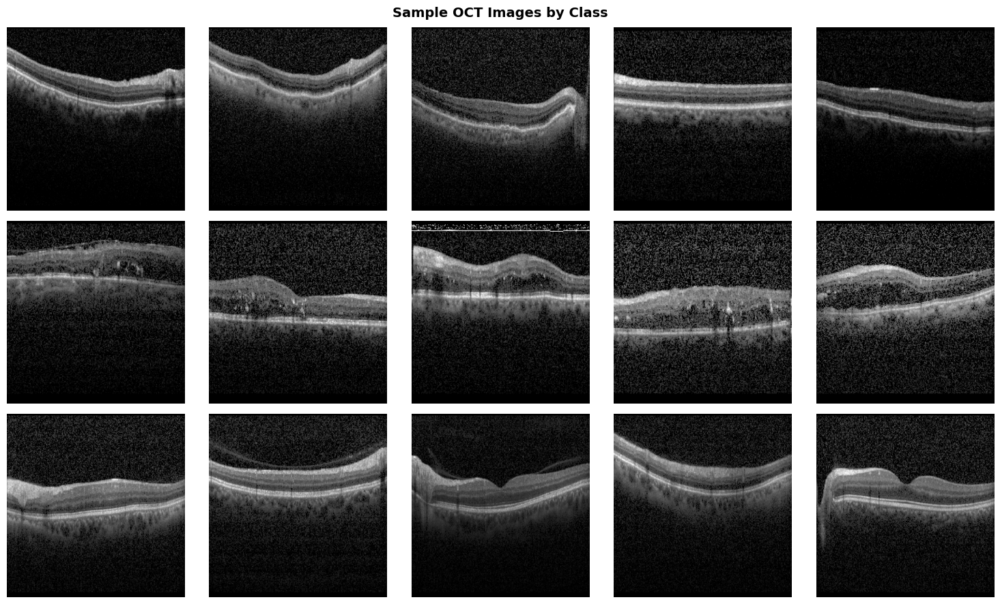

In [82]:
fig, axes = plt.subplots(3, 5, figsize=(15, 9))
fig.suptitle('Sample OCT Images by Class', fontsize=14, fontweight='bold')

for row, cls in enumerate(['AMD', 'DME', 'Normal']):
    class_imgs = [p for p in imgs if Path(p).parts[-4].replace(' Part1','').replace(' Part2','') == cls]
    samples = random.sample(class_imgs, 5)
    for col, path in enumerate(samples):
        axes[row, col].imshow(Image.open(path), cmap='gray')
        axes[row, col].axis('off')
        if col == 0:
            axes[row, col].set_ylabel(cls, fontsize=12, fontweight='bold', rotation=90, labelpad=10)

plt.tight_layout()
plt.savefig('oct_sample_grid.pdf', dpi=150, bbox_inches='tight')
plt.show()

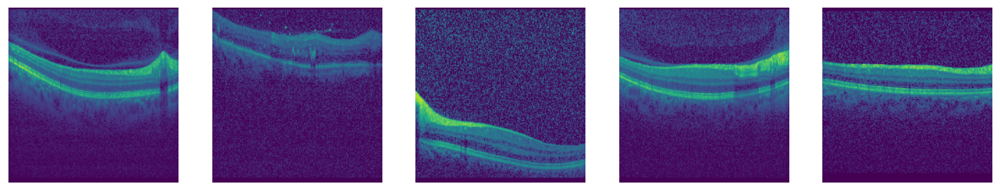

In [83]:
# Random sample
sample = random.sample(imgs, 5)
plt.figure(figsize=(15, 5))
for i, path in enumerate(sample):
    img = Image.open(path)
    plt.subplot(1, 5, i + 1)
    plt.imshow(img)
    plt.axis('off')
plt.show()

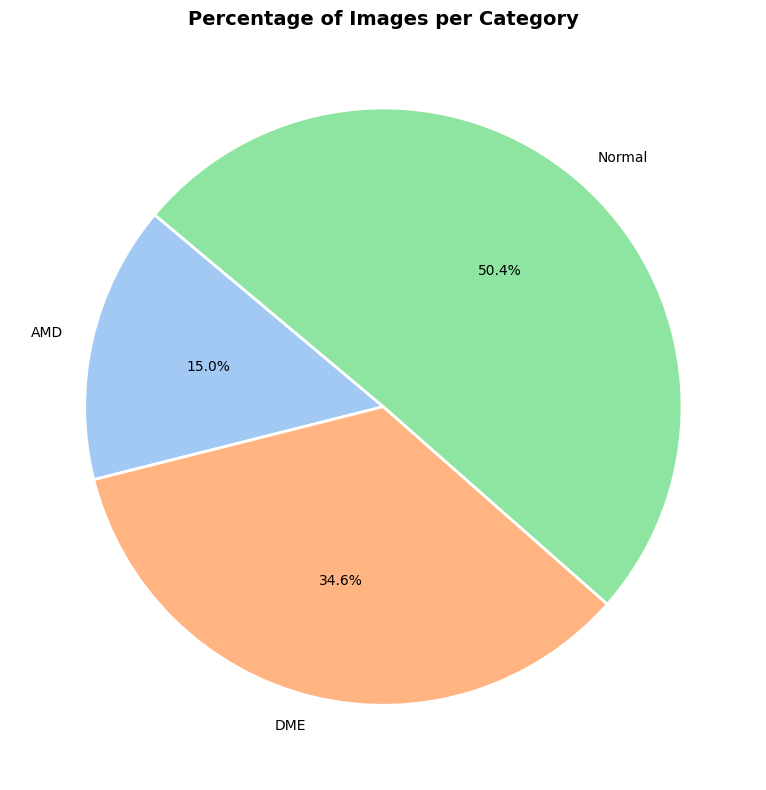

In [84]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8, 8))
colors = sns.color_palette('pastel')[0:len(df_summary)]

plt.pie(
    df_summary['Images'], 
    labels=df_summary['Category'], 
    autopct='%1.1f%%', 
    startangle=140, 
    colors=colors, 
    wedgeprops={'edgecolor': 'white', 'linewidth': 2} 
)

plt.title('Percentage of Images per Category', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('pie_chart.pdf', format='pdf', bbox_inches='tight') 
plt.show()

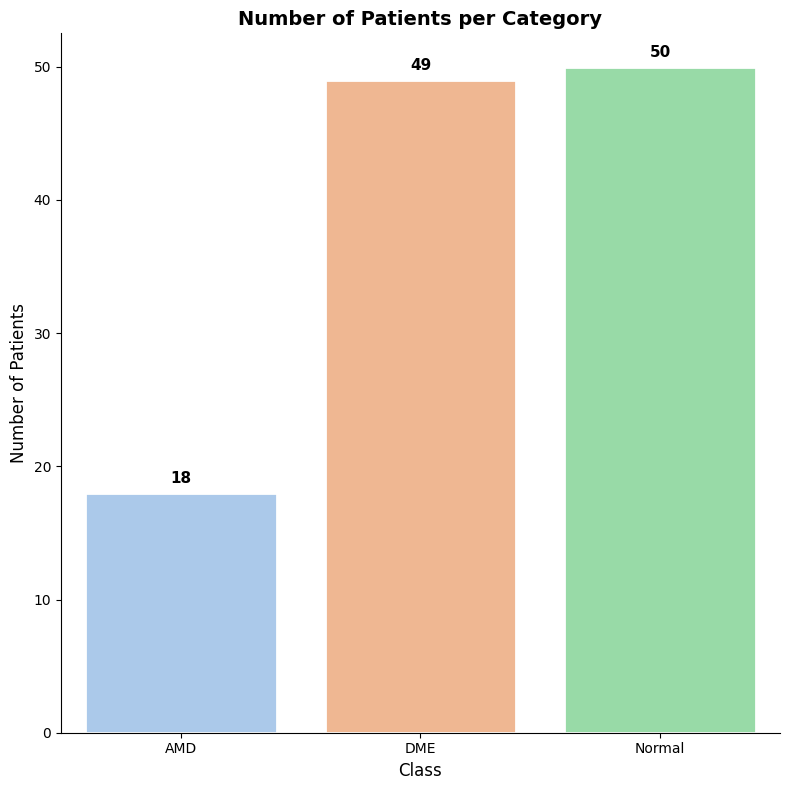

In [85]:
plt.figure(figsize=(8, 8)) 

ax = sns.barplot(
    data=df_summary, 
    x='Category', 
    y='Patients', 
    palette='pastel',
    edgecolor='white',
    linewidth=2
)

plt.title('Number of Patients per Category', fontsize=14, fontweight='bold')
plt.ylabel('Number of Patients', fontsize=12)
plt.xlabel('Class', fontsize=12)

for index, value in enumerate(df_summary['Patients']):
    plt.text(index, value + 0.5, str(value), ha='center', va='bottom', fontweight='bold', fontsize=11)

sns.despine()

plt.tight_layout()
plt.savefig('bar_chart.pdf', format='pdf', bbox_inches='tight')
plt.show()

### ***DataFrame Creation & Label Cleaning***

In [86]:
dati = []
base_dir = DATASET_DIR

for path in imgs:
    p = Path(path)
    rel_path = p.relative_to(base_dir)
    parts = rel_path.parts
    if len(parts) >= 4:
        dati.append({
            'path': str(path),
            'label': parts[0],
            'patient_id': parts[1],
            'date': parts[2]
        })

df = pd.DataFrame(dati)
df['label_clean'] = df['label'].str.replace(' Part1', '').str.replace(' Part2', '')
display(df.head(10))

,path,label,patient_id,date,label_clean
0,/kaggle/input/datasets/susannamazzocchi/rasti-...,AMD Part1,AMD (11).E2E,2- 25- 2017 4- 44- 26 PM,AMD
1,/kaggle/input/datasets/susannamazzocchi/rasti-...,AMD Part1,AMD (11).E2E,2- 25- 2017 4- 44- 26 PM,AMD
2,/kaggle/input/datasets/susannamazzocchi/rasti-...,AMD Part1,AMD (11).E2E,2- 25- 2017 4- 44- 26 PM,AMD
3,/kaggle/input/datasets/susannamazzocchi/rasti-...,AMD Part1,AMD (11).E2E,2- 25- 2017 4- 44- 26 PM,AMD
4,/kaggle/input/datasets/susannamazzocchi/rasti-...,AMD Part1,AMD (11).E2E,2- 25- 2017 4- 44- 26 PM,AMD
5,/kaggle/input/datasets/susannamazzocchi/rasti-...,AMD Part1,AMD (11).E2E,2- 25- 2017 4- 44- 26 PM,AMD
6,/kaggle/input/datasets/susannamazzocchi/rasti-...,AMD Part1,AMD (11).E2E,2- 25- 2017 4- 44- 26 PM,AMD
7,/kaggle/input/datasets/susannamazzocchi/rasti-...,AMD Part1,AMD (11).E2E,2- 25- 2017 4- 44- 26 PM,AMD
8,/kaggle/input/datasets/susannamazzocchi/rasti-...,AMD Part1,AMD (11).E2E,2- 25- 2017 4- 44- 26 PM,AMD
9,/kaggle/input/datasets/susannamazzocchi/rasti-...,AMD Part1,AMD (11).E2E,2- 25- 2017 4- 44- 26 PM,AMD


-----------------------------------------

&nbsp;

## **2. RAM Optimization**

I check the image sizes without opening the full files. I use lazy loading to keep memory usage low while still getting a clear picture of the data dimensions.

In [87]:
sizes = []

for p in tqdm(df['path']):
    try:
        with Image.open(p) as img:
            sizes.append(img.size)
    except:
        sizes.append((None, None))

sizes = pd.DataFrame(sizes, columns=['width','height'])
df = pd.concat([df, sizes], axis=1)

df.describe()

100%|██████████| 3231/3231 [00:06<00:00, 521.81it/s]


,width,height
count,3231.0,3231.0
mean,496.0,512.0
std,0.0,0.0
min,496.0,512.0
25%,496.0,512.0
50%,496.0,512.0
75%,496.0,512.0
max,496.0,512.0


--------------------------------

&nbsp;

## **3. Preprocessing**

In this section I define the full preprocessing pipeline I apply to every OCT image before training. I convert the raw images to grayscale, resize them to a fixed 512×512 resolution, scale the pixel values to the [0,1] range, turn them into tensors, and normalize them to [-1,1] for stable training. I then build a custom PyTorch dataset that applies this pipeline consistently, maps class labels to indices, and includes a sanity check to verify tensor shapes and pixel statistics.

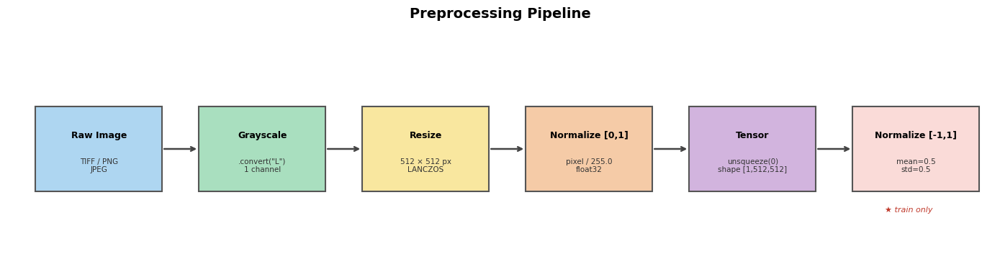

In [88]:
fig, ax = plt.subplots(figsize=(14, 4))
ax.set_xlim(0, 14)
ax.set_ylim(0, 4)
ax.axis('off')
fig.suptitle('Preprocessing Pipeline', fontsize=14, fontweight='bold', y=0.95)

steps = [
    ('Raw Image',        'TIFF / PNG\nJPEG',              '#AED6F1'),
    ('Grayscale',        '.convert("L")\n1 channel',      '#A9DFBF'),
    ('Resize',           '512 × 512 px\nLANCZOS',         '#F9E79F'),
    ('Normalize [0,1]',  'pixel / 255.0\nfloat32',        '#F5CBA7'),
    ('Tensor',           'unsqueeze(0)\nshape [1,512,512]','#D2B4DE'),
    ('Normalize [-1,1]', 'mean=0.5\nstd=0.5',             '#FADBD8'),
]

box_w, box_h = 1.8, 1.4
gap = 0.52
start_x = 0.4
cy = 2.0

for i, (title, subtitle, color) in enumerate(steps):
    x = start_x + i * (box_w + gap)

    box = plt.Rectangle((x, cy - box_h / 2), box_w, box_h,
                         linewidth=1.5, edgecolor='#555', facecolor=color,
                         zorder=2, clip_on=False)
    ax.add_patch(box)

    ax.text(x + box_w / 2, cy + 0.22, title,
            ha='center', va='center', fontsize=9, fontweight='bold', zorder=3)
    ax.text(x + box_w / 2, cy - 0.28, subtitle,
            ha='center', va='center', fontsize=7.5, color='#333', zorder=3)

    if i < len(steps) - 1:
        arrow_x = x + box_w
        ax.annotate('', xy=(arrow_x + gap, cy), xytext=(arrow_x, cy),
                    arrowprops=dict(arrowstyle='->', color='#444', lw=1.8),
                    zorder=3)

ax.text(start_x + 5 * (box_w + gap) + box_w / 2 - 0.1, cy - box_h / 2 - 0.35,
        '★ train only', ha='center', fontsize=8, color='#c0392b', style='italic')

plt.tight_layout()
plt.show()

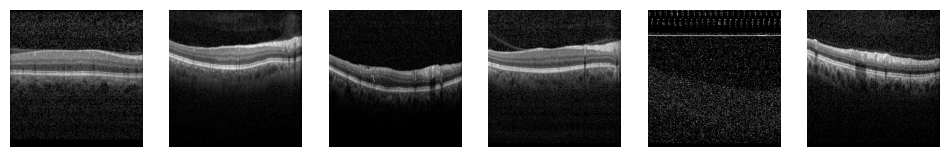

In [89]:
samples = random.sample(df['path'].tolist(), 6)

plt.figure(figsize=(12,4))
for i, p in enumerate(samples):
    img = Image.open(p)
    plt.subplot(1,6,i+1)
    plt.imshow(img, cmap='gray')
    plt.axis('off')

plt.show()

In [90]:
unique_labels = sorted(df['label_clean'].unique())
class_mapping = {name: idx for idx, name in enumerate(unique_labels)}
df['label_idx'] = df['label_clean'].map(class_mapping)

class OCTDataset(Dataset):
    def __init__(self, dataframe, transform=None):
        self.df = dataframe.reset_index(drop=True)
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img = Image.open(row['path']).convert('L')
        img = img.resize((512, 512), Image.Resampling.LANCZOS)
        img = np.array(img, dtype=np.float32) / 255.0
        img = torch.tensor(img).unsqueeze(0)
        if self.transform:
            img = self.transform(img)
        label = row['label_idx']
        return img, label

Index: 1556
Class: Normal
Shape: (1, 512, 512)
Max pixel value: 1.0000
Min pixel value: 0.0000
Mean pixel value: 0.1415


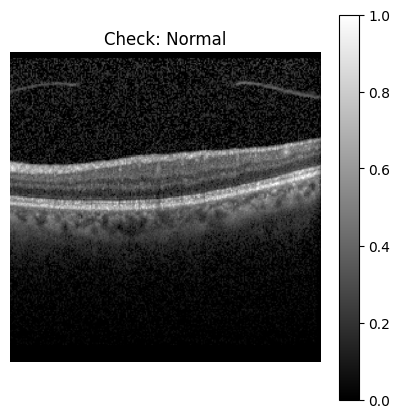

In [91]:
# Sanity Check
inverse_mapping = {v: k for k, v in class_mapping.items()}

dataset = OCTDataset(df)
idx = random.randint(0, len(dataset) - 1)
img_tensor, label_idx = dataset[idx]

print(f"Index: {idx}")
print(f"Class: {inverse_mapping[label_idx]}")
print(f"Shape: {tuple(img_tensor.shape)}")
print(f"Max pixel value: {img_tensor.max():.4f}")
print(f"Min pixel value: {img_tensor.min():.4f}")
print(f"Mean pixel value: {img_tensor.mean():.4f}")

plt.figure(figsize=(5, 5))
plt.imshow(img_tensor.squeeze(), cmap='gray')
plt.title(f"Check: {inverse_mapping[label_idx]}")
plt.colorbar()
plt.axis('off')
plt.show()

This block validates the preprocessing pipeline by inspecting a random sample. It confirms that the image dimensions are correct ($512 \times 512 \times 1$), the pixel values are properly normalized between $0.0$ and $1.0$, and the labels match the visual content.

-----------------------------

&nbsp;

## **4. Data Splitting**

I split the dataset at the patient level using StratifiedGroupKFold, so that images from the same patient never end up in more than one subset. The first split sets aside roughly 67% of patients for training and 33% for a temporary pool, which I then divide equally into validation and test sets (about 16% each). Stratification keeps the class distribution of AMD, DME, and Normal cases consistent across all three subsets.

In [92]:
y = df['label_idx'].values
sgkf_train = StratifiedGroupKFold(n_splits=3, shuffle=True, random_state=42)
train_idx, temp_idx = next(sgkf_train.split(df, y, df['patient_id']))
df_train = df.iloc[train_idx]
df_temp  = df.iloc[temp_idx]

sgkf_val_test = StratifiedGroupKFold(n_splits=2, shuffle=True, random_state=42)
val_idx, test_idx = next(sgkf_val_test.split(df_temp, df_temp['label_idx'], df_temp['patient_id']))
df_val  = df_temp.iloc[val_idx]
df_test = df_temp.iloc[test_idx]

train_dataset = OCTDataset(df_train)
val_dataset   = OCTDataset(df_val)
test_dataset  = OCTDataset(df_test)

y_train = df_train['label_idx'].values
cw = compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)
class_weights = torch.tensor(cw, dtype=torch.float).to(DEVICE)

total = len(df)
split_data = {
    "Dataset Portion": ["Training", "Validation", "Test", "Total"],
    "Images": [len(df_train), len(df_val), len(df_test), total],
    "Unique Patients": [
        df_train['patient_id'].nunique(),
        df_val['patient_id'].nunique(),
        df_test['patient_id'].nunique(),
        df['patient_id'].nunique()
    ],
    "Percentage": [
        f"{len(df_train)/total*100:.1f}%",
        f"{len(df_val)/total*100:.1f}%",
        f"{len(df_test)/total*100:.1f}%",
        "100%"
    ]
}
print(f"{'DATASET SPLIT SUMMARY':^60}")
display(pd.DataFrame(split_data))

                   DATASET SPLIT SUMMARY                    


,Dataset Portion,Images,Unique Patients,Percentage
0,Training,2093,77,64.8%
1,Validation,585,21,18.1%
2,Test,553,19,17.1%
3,Total,3231,117,100%


In [93]:
def split_distribution_table(splits: dict) -> pd.DataFrame:
    rows = []
    for split_name, dframe in splits.items():
        total_split = len(dframe)
        for label in sorted(dframe['label_clean'].unique()):
            count = (dframe['label_clean'] == label).sum()
            rows.append({
                'Split':   split_name,
                'Class':   label,
                'Images':  count,
                'Split %': count / total_split,
            })
    return pd.DataFrame(rows)

splits = {'Train': df_train, 'Validation': df_val, 'Test': df_test}
df_dist = split_distribution_table(splits)
pivot = df_dist.pivot_table(
    index='Class',
    columns='Split',
    values=['Images', 'Split %'],
    aggfunc='first'
)[['Images', 'Split %']].swaplevel(axis=1)[['Train', 'Validation', 'Test']]

styled_pivot = (
    pivot.style
    .background_gradient(cmap='Blues', axis=None)
    .format({(s, 'Split %'): '{:.1%}' for s in splits.keys()})
    .set_caption('<b>Class Distribution Across Splits</b>')
    .set_properties(**{
        'text-align': 'center',
        'padding': '12px',
        'border': '1px solid #f2f2f2',
        'font-family': 'sans-serif'
    })
    .set_table_styles([
        {'selector': 'th', 'props': [
            ('background-color', 'white'),
            ('color', '#555'),
            ('font-weight', 'bold'),
            ('border', '1px solid #f2f2f2')
        ]},
        {'selector': 'caption', 'props': [
            ('font-size', '16px'),
            ('margin-bottom', '15px'),
            ('color', '#333')
        ]}
    ])
)
display(styled_pivot)

-----------------------------------

&nbsp;

## **5. Data Augmentation**

I apply augmentation only to the training set, to add variability and reduce the risk of overfitting. The validation and test sets go through normalization only, so the evaluation stays unbiased.

In [94]:
train_transforms = T.Compose([
    T.RandomHorizontalFlip(),
    T.RandomRotation(degrees=10),
    T.RandomAffine(degrees=0, translate=(0.05, 0.05)),
    T.RandomApply([T.ColorJitter(brightness=0.3, contrast=0.3)], p=0.5),
    T.RandomApply([T.GaussianBlur(kernel_size=5, sigma=(0.1, 1.5))], p=0.3),
    T.Normalize(mean=[0.5], std=[0.5])
])


val_test_transforms = T.Compose([
    T.Normalize(mean=[0.5], std=[0.5])
])

train_dataset = OCTDataset(df_train, transform=train_transforms)
val_dataset   = OCTDataset(df_val,   transform=val_test_transforms)
test_dataset  = OCTDataset(df_test,  transform=val_test_transforms)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True,
                          num_workers=2, pin_memory=torch.cuda.is_available(),
                          worker_init_fn=seed_worker, generator=G)
val_loader   = DataLoader(val_dataset,   batch_size=32, shuffle=False,
                          num_workers=2, pin_memory=torch.cuda.is_available(),
                          worker_init_fn=seed_worker)
test_loader  = DataLoader(test_dataset,  batch_size=32, shuffle=False,
                          num_workers=2, pin_memory=torch.cuda.is_available(),
                          worker_init_fn=seed_worker)

### ***Distribution of the Classes Across Splits***

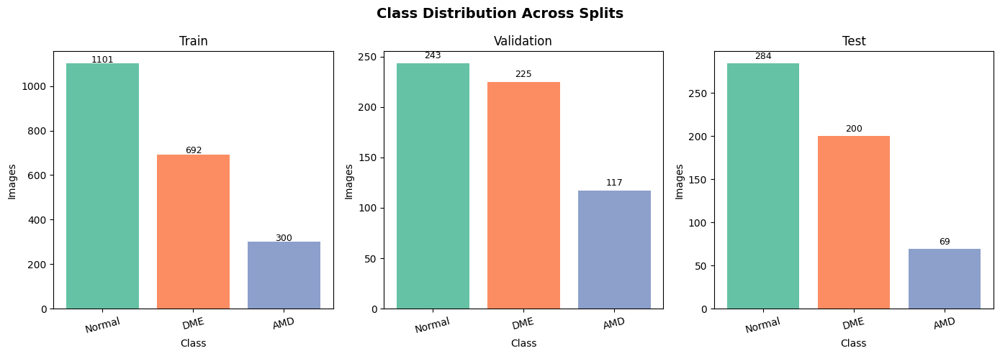

In [95]:
fig, axes = plt.subplots(1, 3, figsize=(14, 5))
fig.suptitle('Class Distribution Across Splits', fontsize=14, fontweight='bold')

for ax, (name, dframe) in zip(axes, [('Train', df_train), ('Validation', df_val), ('Test', df_test)]):
    counts = dframe['label_clean'].value_counts()
    ax.bar(counts.index, counts.values, color=sns.color_palette('Set2', len(counts)))
    ax.set_title(name)
    ax.set_ylabel('Images')
    ax.set_xlabel('Class')
    ax.tick_params(axis='x', rotation=15)
    for j, v in enumerate(counts.values):
        ax.text(j, v + 5, str(v), ha='center', fontsize=9)

plt.tight_layout()
plt.show()

### ***Visualization of Augmented Samples***

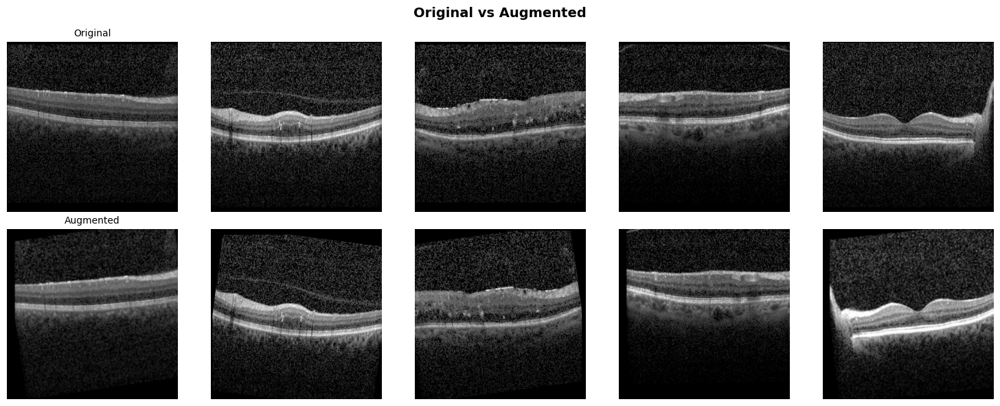

In [96]:
sample_indices = random.sample(range(len(df_train)), 5)  # 5 random samples
df_sample = df_train.iloc[sample_indices].reset_index(drop=True)
base_dataset = OCTDataset(df_sample, transform=None)

# Dataset with augmentation
aug_dataset = OCTDataset(df_sample, transform=train_transforms)

fig, axes = plt.subplots(2, 5, figsize=(15, 6))
fig.suptitle('Original vs Augmented', fontsize=14, fontweight='bold')

for i in range(5):
    img_orig, _ = base_dataset[i]   # no augmentation
    img_aug, _  = aug_dataset[i]    # withaugmentation

    # denormalize
    img_aug_vis = (img_aug * 0.5 + 0.5).clamp(0, 1)

    axes[0, i].imshow(img_orig.squeeze(), cmap='gray')
    axes[0, i].axis('off')
    if i == 0: axes[0, i].set_title('Original', fontsize=10)

    axes[1, i].imshow(img_aug_vis.squeeze(), cmap='gray')
    axes[1, i].axis('off')
    if i == 0: axes[1, i].set_title('Augmented', fontsize=10)

plt.tight_layout()
plt.show()

---------------------------

&nbsp;

## **6. Model Architecture**

Here I test two architectures: a lightweight custom CNN that acts as a baseline, and EfficientNet-B0 with transfer learning as the main model. Both take single channel grayscale input and produce a 3 class output.

In [97]:
class CustomCNN(nn.Module):
    def __init__(self, num_classes=3):
        super().__init__()
        self.features = nn.Sequential(
            nn.Conv2d(1, 32, kernel_size=3, padding=1), nn.BatchNorm2d(32), nn.ReLU(), nn.MaxPool2d(2),
            nn.Conv2d(32, 64, kernel_size=3, padding=1), nn.BatchNorm2d(64), nn.ReLU(), nn.MaxPool2d(2),
            nn.Conv2d(64, 128, kernel_size=3, padding=1), nn.BatchNorm2d(128), nn.ReLU(), nn.MaxPool2d(2),
        )
        self.classifier = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Flatten(),
            nn.Dropout(0.4),
            nn.Linear(128, num_classes)
        )

    def forward(self, x):
        return self.classifier(self.features(x))


class EfficientNetOCT(nn.Module):
    def __init__(self, num_classes=3):
        super().__init__()
        self.base = efficientnet_b0(weights=EfficientNet_B0_Weights.DEFAULT)

        pretrained_weight = self.base.features[0][0].weight.data.mean(dim=1, keepdim=True)
        self.base.features[0][0] = nn.Conv2d(1, 32, kernel_size=3, stride=2, padding=1, bias=False)
        self.base.features[0][0].weight.data = pretrained_weight

        in_features = self.base.classifier[1].in_features
        self.base.classifier = nn.Sequential(
            nn.Dropout(0.4),
            nn.Linear(in_features, num_classes)
        )

    def forward(self, x):
        return self.base(x)




models_dict = {
    'CustomCNN':    CustomCNN(num_classes=3).to(DEVICE),
    'EfficientNet': EfficientNetOCT(num_classes=3).to(DEVICE),
}

for name, model in models_dict.items():
    n_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    print(f"{name}: {n_params:,} trainable parameters")

CustomCNN: 93,507 trainable parameters
EfficientNet: 4,010,815 trainable parameters


I train EfficientNet in two stages. First I unfreeze only the new classifier head, so it can adapt the pretrained features to OCT data. Then I unfreeze the full network for fine-tuning. The custom CNN, on the other hand, is trained from scratch, so no freezing is needed there.

In [98]:
def freeze_backbone(model):
    for param in model.base.parameters():
        param.requires_grad = False
    head = getattr(model.base, 'classifier', None) or getattr(model.base, 'fc', None)
    for param in head.parameters():
        param.requires_grad = True

def unfreeze_backbone(model):
    for param in model.base.parameters():
        param.requires_grad = True

label_counts = df_train['label_idx'].value_counts().sort_index()
total = label_counts.sum()
class_weights = total / (len(label_counts) * label_counts.values)
class_weights_tensor = torch.tensor(class_weights, dtype=torch.float).to(DEVICE)

criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)

optimizers_dict = {
    'CustomCNN':    optim.Adam(models_dict['CustomCNN'].parameters(),    lr=1e-3),
    'EfficientNet': optim.Adam(models_dict['EfficientNet'].parameters(), lr=1e-4),
}

schedulers_dict = {
    'CustomCNN':    optim.lr_scheduler.ReduceLROnPlateau(optimizers_dict['CustomCNN'],    patience=3, factor=0.5),
    'EfficientNet': optim.lr_scheduler.ReduceLROnPlateau(optimizers_dict['EfficientNet'], patience=3, factor=0.5),
}

freeze_backbone(models_dict['EfficientNet'])

for name, model in models_dict.items():
    n_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    print(f"{name}: {n_params:,} trainable parameters after freeze")

CustomCNN: 93,507 trainable parameters after freeze
EfficientNet: 3,843 trainable parameters after freeze


---------------------------

&nbsp;

## **7. Training & Hyperparameter Tuning**

I train each model for up to 50 epochs, with early stopping based on validation loss. EfficientNet starts with a frozen backbone for the first 10 epochs, then I unfreeze it fully for fine-tuning. 

In [99]:
def train_one_epoch(model, loader, optimizer, criterion):
    model.train()
    total_loss, correct = 0, 0
    for imgs, labels in loader:
        imgs, labels = imgs.to(DEVICE), labels.to(DEVICE)
        optimizer.zero_grad()
        outputs = model(imgs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        total_loss += loss.item() * imgs.size(0)
        correct += (outputs.argmax(1) == labels).sum().item()
    return total_loss / len(loader.dataset), correct / len(loader.dataset)


def evaluate(model, loader, criterion):
    model.eval()
    total_loss, correct = 0, 0
    with torch.no_grad():
        for imgs, labels in loader:
            imgs, labels = imgs.to(DEVICE), labels.to(DEVICE)
            outputs = model(imgs)
            loss = criterion(outputs, labels)
            total_loss += loss.item() * imgs.size(0)
            correct += (outputs.argmax(1) == labels).sum().item()
    return total_loss / len(loader.dataset), correct / len(loader.dataset)


def train_model(name, model, optimizer, scheduler, epochs=50, unfreeze_epoch=10):
    history = {'train_loss': [], 'val_loss': [], 'train_acc': [], 'val_acc': [], 'lr': []}
    best_val_loss = float('inf')
    patience_counter = 0
    early_stopping_patience = 15

    epoch_bar = tqdm(range(epochs), desc=f'{name}', unit='epoch',
                     bar_format='{l_bar}{bar:30}{r_bar}')

    for epoch in epoch_bar:
        if name in ('EfficientNet') and epoch == unfreeze_epoch:
            unfreeze_backbone(model)
            optimizer = torch.optim.Adam(
                model.parameters(),
                lr=1e-5,      
                weight_decay=1e-4
            )
            scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=3, factor=0.5)
            tqdm.write(f'  ↳ Backbone unfrozen at epoch {epoch+1}, lr → 1e-5')

        train_loss, train_acc = train_one_epoch(model, train_loader, optimizer, criterion)
        val_loss, val_acc     = evaluate(model, val_loader, criterion)
        scheduler.step(val_loss)

        current_lr = optimizer.param_groups[0]['lr']
        history['lr'].append(current_lr)
        history['train_loss'].append(train_loss)
        history['val_loss'].append(val_loss)
        history['train_acc'].append(train_acc)
        history['val_acc'].append(val_acc)

        epoch_bar.set_postfix({
            'tr_loss': f'{train_loss:.4f}',
            'vl_loss': f'{val_loss:.4f}',
            'tr_acc':  f'{train_acc:.3f}',
            'vl_acc':  f'{val_acc:.3f}',
            'lr':      f'{current_lr:.1e}'
        })

        if val_loss < best_val_loss:
            best_val_loss = val_loss
            patience_counter = 0
            torch.save(model.state_dict(), f'best_{name}.pth')
            tqdm.write(f'  ✔ Epoch {epoch+1:02d} — new best val loss: {val_loss:.4f}')
        else:
            patience_counter += 1
            if patience_counter >= early_stopping_patience:
                tqdm.write(f'  ✖ Early stopping at epoch {epoch+1}')
                break

    model.load_state_dict(torch.load(f'best_{name}.pth', weights_only=True))
    tqdm.write(f'  ★ Best model restored (val loss: {best_val_loss:.4f})\n')
    return history


histories = {}
for name, model in models_dict.items():
    print(f'\n{"─"*50}')
    print(f'  Training: {name}')
    print(f'{"─"*50}')
    histories[name] = train_model(name, model, optimizers_dict[name], schedulers_dict[name])


──────────────────────────────────────────────────
  Training: CustomCNN
──────────────────────────────────────────────────


CustomCNN:   2%|▌                             | 1/50 [00:33<27:41, 33.90s/epoch, tr_loss=1.0919, vl_loss=1.1428, tr_acc=0.445, vl_acc=0.511, lr=1.0e-03]

  ✔ Epoch 01 — new best val loss: 1.1428


CustomCNN:   8%|██▍                           | 4/50 [02:11<25:09, 32.81s/epoch, tr_loss=1.0123, vl_loss=1.0157, tr_acc=0.556, vl_acc=0.540, lr=1.0e-03]

  ✔ Epoch 04 — new best val loss: 1.0157


CustomCNN:  14%|████▏                         | 7/50 [03:51<23:38, 32.98s/epoch, tr_loss=0.9695, vl_loss=0.9167, tr_acc=0.596, vl_acc=0.631, lr=1.0e-03]

  ✔ Epoch 07 — new best val loss: 0.9167


CustomCNN:  18%|█████▍                        | 9/50 [04:56<22:30, 32.95s/epoch, tr_loss=0.9745, vl_loss=0.9146, tr_acc=0.587, vl_acc=0.643, lr=1.0e-03]

  ✔ Epoch 09 — new best val loss: 0.9146


CustomCNN:  24%|███████▏                      | 12/50 [06:35<20:52, 32.96s/epoch, tr_loss=0.8993, vl_loss=0.8530, tr_acc=0.627, vl_acc=0.655, lr=1.0e-03]

  ✔ Epoch 12 — new best val loss: 0.8530


CustomCNN:  30%|█████████                     | 15/50 [08:15<19:20, 33.16s/epoch, tr_loss=0.8838, vl_loss=0.8147, tr_acc=0.663, vl_acc=0.627, lr=1.0e-03]

  ✔ Epoch 15 — new best val loss: 0.8147


CustomCNN:  34%|██████████▏                   | 17/50 [09:21<18:13, 33.13s/epoch, tr_loss=0.8396, vl_loss=0.7743, tr_acc=0.675, vl_acc=0.658, lr=1.0e-03]

  ✔ Epoch 17 — new best val loss: 0.7743


CustomCNN:  36%|██████████▊                   | 18/50 [09:54<17:38, 33.08s/epoch, tr_loss=0.8466, vl_loss=0.7041, tr_acc=0.659, vl_acc=0.752, lr=1.0e-03]

  ✔ Epoch 18 — new best val loss: 0.7041


CustomCNN:  54%|████████████████▏             | 27/50 [14:48<12:27, 32.50s/epoch, tr_loss=0.7389, vl_loss=0.6777, tr_acc=0.725, vl_acc=0.685, lr=2.5e-04]

  ✔ Epoch 27 — new best val loss: 0.6777


CustomCNN:  58%|█████████████████▍            | 29/50 [15:54<11:24, 32.58s/epoch, tr_loss=0.7216, vl_loss=0.6133, tr_acc=0.746, vl_acc=0.771, lr=2.5e-04]

  ✔ Epoch 29 — new best val loss: 0.6133


CustomCNN:  68%|████████████████████▍         | 34/50 [18:34<08:36, 32.27s/epoch, tr_loss=0.7030, vl_loss=0.6030, tr_acc=0.756, vl_acc=0.771, lr=1.3e-04]

  ✔ Epoch 34 — new best val loss: 0.6030


CustomCNN:  96%|████████████████████████████▊ | 48/50 [26:38<01:06, 33.29s/epoch, tr_loss=0.6862, vl_loss=0.6112, tr_acc=0.762, vl_acc=0.738, lr=1.6e-05]


  ✖ Early stopping at epoch 49
  ★ Best model restored (val loss: 0.6030)


──────────────────────────────────────────────────
  Training: EfficientNet
──────────────────────────────────────────────────


EfficientNet:   2%|▌                             | 1/50 [00:32<26:33, 32.52s/epoch, tr_loss=1.0864, vl_loss=1.0859, tr_acc=0.395, vl_acc=0.421, lr=1.0e-04]

  ✔ Epoch 01 — new best val loss: 1.0859


EfficientNet:   4%|█▏                            | 2/50 [01:04<25:59, 32.48s/epoch, tr_loss=1.0160, vl_loss=1.0039, tr_acc=0.600, vl_acc=0.523, lr=1.0e-04]

  ✔ Epoch 02 — new best val loss: 1.0039


EfficientNet:   6%|█▊                            | 3/50 [01:37<25:34, 32.66s/epoch, tr_loss=0.9764, vl_loss=0.9749, tr_acc=0.653, vl_acc=0.530, lr=1.0e-04]

  ✔ Epoch 03 — new best val loss: 0.9749


EfficientNet:   8%|██▍                           | 4/50 [02:09<24:51, 32.43s/epoch, tr_loss=0.9364, vl_loss=0.9529, tr_acc=0.659, vl_acc=0.533, lr=1.0e-04]

  ✔ Epoch 04 — new best val loss: 0.9529


EfficientNet:  10%|███                           | 5/50 [02:41<24:13, 32.29s/epoch, tr_loss=0.9110, vl_loss=0.9359, tr_acc=0.682, vl_acc=0.545, lr=1.0e-04]

  ✔ Epoch 05 — new best val loss: 0.9359


EfficientNet:  12%|███▌                          | 6/50 [03:13<23:30, 32.06s/epoch, tr_loss=0.8933, vl_loss=0.9179, tr_acc=0.687, vl_acc=0.566, lr=1.0e-04]

  ✔ Epoch 06 — new best val loss: 0.9179


EfficientNet:  14%|████▏                         | 7/50 [03:45<22:57, 32.04s/epoch, tr_loss=0.8718, vl_loss=0.9084, tr_acc=0.696, vl_acc=0.578, lr=1.0e-04]

  ✔ Epoch 07 — new best val loss: 0.9084


EfficientNet:  16%|████▊                         | 8/50 [04:17<22:27, 32.08s/epoch, tr_loss=0.8476, vl_loss=0.8900, tr_acc=0.699, vl_acc=0.591, lr=1.0e-04]

  ✔ Epoch 08 — new best val loss: 0.8900


EfficientNet:  18%|█████▍                        | 9/50 [04:49<21:55, 32.09s/epoch, tr_loss=0.8271, vl_loss=0.8880, tr_acc=0.720, vl_acc=0.614, lr=1.0e-04]

  ✔ Epoch 09 — new best val loss: 0.8880


EfficientNet:  20%|██████                        | 10/50 [05:22<21:25, 32.13s/epoch, tr_loss=0.8182, vl_loss=0.8633, tr_acc=0.707, vl_acc=0.631, lr=1.0e-04]

  ✔ Epoch 10 — new best val loss: 0.8633
  ↳ Backbone unfrozen at epoch 11, lr → 1e-5


EfficientNet:  22%|██████▌                       | 11/50 [06:15<25:05, 38.60s/epoch, tr_loss=0.7574, vl_loss=0.7720, tr_acc=0.749, vl_acc=0.732, lr=1.0e-05]

  ✔ Epoch 11 — new best val loss: 0.7720


EfficientNet:  24%|███████▏                      | 12/50 [07:08<27:15, 43.05s/epoch, tr_loss=0.6889, vl_loss=0.7041, tr_acc=0.782, vl_acc=0.783, lr=1.0e-05]

  ✔ Epoch 12 — new best val loss: 0.7041


EfficientNet:  26%|███████▊                      | 13/50 [08:01<28:26, 46.13s/epoch, tr_loss=0.5946, vl_loss=0.6048, tr_acc=0.816, vl_acc=0.817, lr=1.0e-05]

  ✔ Epoch 13 — new best val loss: 0.6048


EfficientNet:  28%|████████▍                     | 14/50 [08:54<28:57, 48.25s/epoch, tr_loss=0.5217, vl_loss=0.5519, tr_acc=0.852, vl_acc=0.812, lr=1.0e-05]

  ✔ Epoch 14 — new best val loss: 0.5519


EfficientNet:  30%|█████████                     | 15/50 [09:48<29:00, 49.73s/epoch, tr_loss=0.4423, vl_loss=0.4764, tr_acc=0.879, vl_acc=0.839, lr=1.0e-05]

  ✔ Epoch 15 — new best val loss: 0.4764


EfficientNet:  32%|█████████▌                    | 16/50 [10:41<28:46, 50.79s/epoch, tr_loss=0.3911, vl_loss=0.4357, tr_acc=0.891, vl_acc=0.841, lr=1.0e-05]

  ✔ Epoch 16 — new best val loss: 0.4357


EfficientNet:  34%|██████████▏                   | 17/50 [11:34<28:20, 51.52s/epoch, tr_loss=0.3404, vl_loss=0.4071, tr_acc=0.903, vl_acc=0.862, lr=1.0e-05]

  ✔ Epoch 17 — new best val loss: 0.4071


EfficientNet:  36%|██████████▊                   | 18/50 [12:27<27:44, 52.02s/epoch, tr_loss=0.3150, vl_loss=0.4004, tr_acc=0.898, vl_acc=0.853, lr=1.0e-05]

  ✔ Epoch 18 — new best val loss: 0.4004


EfficientNet:  38%|███████████▍                  | 19/50 [13:21<27:04, 52.41s/epoch, tr_loss=0.2723, vl_loss=0.3557, tr_acc=0.912, vl_acc=0.868, lr=1.0e-05]

  ✔ Epoch 19 — new best val loss: 0.3557


EfficientNet:  40%|████████████                  | 20/50 [14:14<26:20, 52.68s/epoch, tr_loss=0.2360, vl_loss=0.3525, tr_acc=0.928, vl_acc=0.865, lr=1.0e-05]

  ✔ Epoch 20 — new best val loss: 0.3525


EfficientNet:  44%|█████████████▏                | 22/50 [16:00<24:42, 52.94s/epoch, tr_loss=0.2018, vl_loss=0.3426, tr_acc=0.938, vl_acc=0.863, lr=1.0e-05]

  ✔ Epoch 22 — new best val loss: 0.3426


EfficientNet:  48%|██████████████▍               | 24/50 [17:47<23:00, 53.08s/epoch, tr_loss=0.1658, vl_loss=0.3190, tr_acc=0.949, vl_acc=0.879, lr=1.0e-05]

  ✔ Epoch 24 — new best val loss: 0.3190


EfficientNet:  52%|███████████████▌              | 26/50 [19:33<21:14, 53.09s/epoch, tr_loss=0.1570, vl_loss=0.3165, tr_acc=0.943, vl_acc=0.880, lr=1.0e-05]

  ✔ Epoch 26 — new best val loss: 0.3165


EfficientNet:  80%|████████████████████████      | 40/50 [32:51<08:12, 49.28s/epoch, tr_loss=0.0901, vl_loss=0.3393, tr_acc=0.971, vl_acc=0.884, lr=1.3e-06]

  ✖ Early stopping at epoch 41
  ★ Best model restored (val loss: 0.3165)



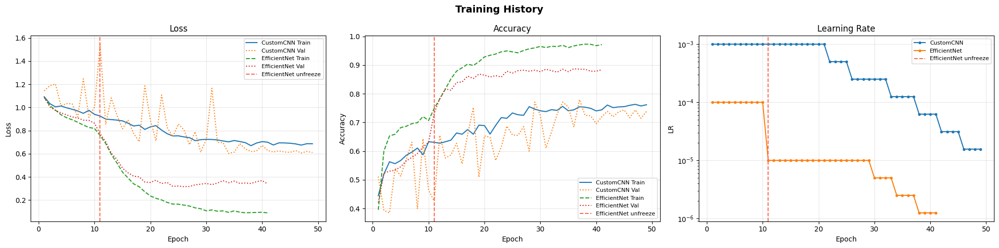

In [100]:
UNFREEZE_EPOCH = 10

fig, axes = plt.subplots(1, 3, figsize=(20, 5))
fig.suptitle('Training History', fontsize=14, fontweight='bold')

for name, history in histories.items():
    epochs_ran = range(1, len(history['train_loss']) + 1)
    ls = '--' if name == 'EfficientNet' else '-'

    axes[0].plot(epochs_ran, history['train_loss'], linestyle=ls,  label=f'{name} Train')
    axes[0].plot(epochs_ran, history['val_loss'],   linestyle=':',  label=f'{name} Val')

    axes[1].plot(epochs_ran, history['train_acc'],  linestyle=ls,  label=f'{name} Train')
    axes[1].plot(epochs_ran, history['val_acc'],    linestyle=':',  label=f'{name} Val')

    axes[2].plot(epochs_ran, history['lr'], label=name, marker='o', markersize=3)

for ax in axes[:2]:
    eff_epochs = len(histories['EfficientNet']['train_loss'])
    if UNFREEZE_EPOCH < eff_epochs:
        ax.axvline(x=UNFREEZE_EPOCH + 1, color='tomato', linestyle='--', linewidth=1.4,
                   label='EfficientNet unfreeze')

eff_epochs = len(histories['EfficientNet']['train_loss'])
if UNFREEZE_EPOCH < eff_epochs:
    axes[2].axvline(x=UNFREEZE_EPOCH + 1, color='tomato', linestyle='--', linewidth=1.4,
                    label='EfficientNet unfreeze')

axes[0].set_title('Loss')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Loss')

axes[1].set_title('Accuracy')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Accuracy')

axes[2].set_title('Learning Rate')
axes[2].set_xlabel('Epoch')
axes[2].set_ylabel('LR')
axes[2].set_yscale('log')

for ax in axes:
    ax.legend(fontsize=8)
    ax.grid(alpha=0.3)

plt.tight_layout()
plt.show()

In [101]:
summary = {
    'Model':         list(models_dict.keys()),
    'Best Val Loss': [min(histories[n]['val_loss']) for n in models_dict],
    'Best Val Acc':  [max(histories[n]['val_acc'])  for n in models_dict],
    'Epochs Run':    [len(histories[n]['train_loss']) for n in models_dict]
}
display(pd.DataFrame(summary))

,Model,Best Val Loss,Best Val Acc,Epochs Run
0,CustomCNN,0.602962,0.779487,49
1,EfficientNet,0.316456,0.887179,41


-------------------------------------------------

&nbsp;

## **8. Final Evaluation & Metrics**

I evaluate both models on the held out test set. I report the confusion matrix, classification report, multiclass ROC AUC, and Grad-CAM saliency maps to see where each model focuses its attention.

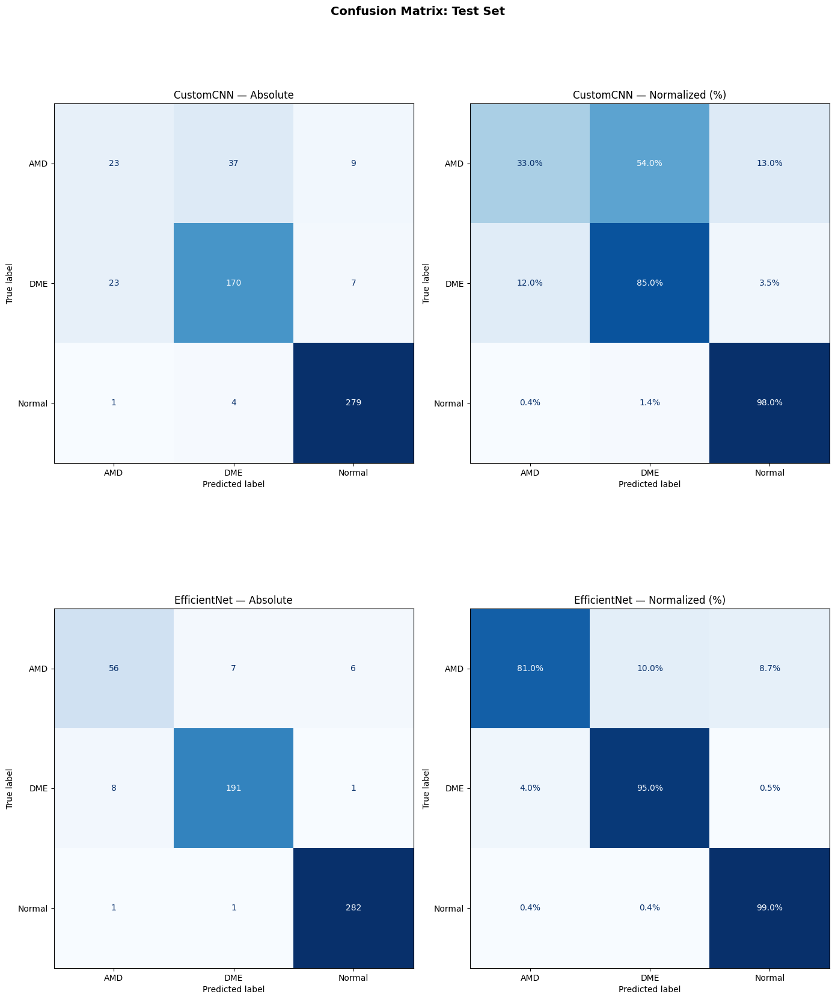

In [102]:
def get_predictions(model, loader):
    model.eval()
    all_preds, all_labels, all_probs = [], [], []
    with torch.no_grad():
        for imgs, labels in loader:
            imgs = imgs.to(DEVICE)
            outputs = model(imgs)
            probs = torch.softmax(outputs, dim=1)
            all_probs.append(probs.cpu().numpy())
            all_preds.append(outputs.argmax(1).cpu().numpy())
            all_labels.append(labels.numpy())
    return (
        np.concatenate(all_labels),
        np.concatenate(all_preds),
        np.concatenate(all_probs)
    )

class_names = [inverse_mapping[i] for i in range(len(class_mapping))]

fig, axes = plt.subplots(2, 2, figsize=(14, 18))
fig.suptitle('Confusion Matrix: Test Set', fontsize=14, fontweight='bold')

results = {}
for row, (name, model) in enumerate(models_dict.items()):
    y_true, y_pred, y_probs = get_predictions(model, test_loader)
    results[name] = (y_true, y_pred, y_probs)

    cm      = confusion_matrix(y_true, y_pred)
    cm_norm = confusion_matrix(y_true, y_pred, normalize='true')

    ConfusionMatrixDisplay(cm, display_labels=class_names).plot(
        ax=axes[row, 0], colorbar=False, cmap='Blues'
    )
    axes[row, 0].set_title(f'{name} — Absolute')

    ConfusionMatrixDisplay(cm_norm, display_labels=class_names).plot(
        ax=axes[row, 1], colorbar=False, cmap='Blues'
    )
    axes[row, 1].set_title(f'{name} — Normalized (%)')
    for text in axes[row, 1].texts:
        text.set_text(f"{float(text.get_text()):.1%}")

plt.tight_layout()
plt.show()

In [103]:
def build_metrics_table(name, y_true, y_pred, y_probs):
    report = classification_report(y_true, y_pred, target_names=class_names, output_dict=True)
    y_bin  = label_binarize(y_true, classes=range(len(class_names)))

    rows = []
    for i, cls in enumerate(class_names):
        auc_val = roc_auc_score(y_bin[:, i], y_probs[:, i])
        rows.append({
            'Class':     cls,
            'Precision': round(report[cls]['precision'], 3),
            'Recall':    round(report[cls]['recall'],    3),
            'F1-Score':  round(report[cls]['f1-score'],  3),
            'Support':   int(report[cls]['support']),
            'AUC':       round(auc_val, 3),
        })

    macro = report['macro avg']
    rows.append({
        'Class':     'macro avg',
        'Precision': round(macro['precision'], 3),
        'Recall':    round(macro['recall'],    3),
        'F1-Score':  round(macro['f1-score'],  3),
        'Support':   int(macro['support']),
        'AUC':       round(roc_auc_score(y_bin, y_probs, multi_class='ovr', average='macro'), 3),
    })

    df_m = pd.DataFrame(rows).set_index('Class')

    gradient_cols = ['Precision', 'Recall', 'F1-Score', 'AUC']

    styled_df = (
        df_m.style
        .background_gradient(cmap='Blues', subset=gradient_cols, vmin=0.5, vmax=1.0)
        .format({c: '{:.3f}' for c in gradient_cols})
        .set_caption(f'<b>Classification Metrics — {name}</b>')
        .set_properties(**{
            'text-align': 'center',
            'padding': '8px',
            'border': '1px solid #dee2e6',
            'font-family': 'sans-serif'
        })
        .set_table_styles([
            {'selector': 'th', 'props': [('background-color', '#f8f9fa'), ('color', '#333'), ('font-weight', 'bold')]},
            {'selector': 'caption', 'props': [('font-size', '16px'), ('margin-bottom', '10px')]}
        ])
    )

    display(styled_df)

for name, (y_true, y_pred, y_probs) in results.items():
    build_metrics_table(name, y_true, y_pred, y_probs)

,Precision,Recall,F1-Score,Support,AUC
Class,,,,,
AMD,0.489,0.333,0.397,69,0.846
DME,0.806,0.850,0.827,200,0.924
Normal,0.946,0.982,0.964,284,0.982
macro avg,0.747,0.722,0.729,553,0.917


,Precision,Recall,F1-Score,Support,AUC
Class,,,,,
AMD,0.862,0.812,0.836,69,0.989
DME,0.960,0.955,0.957,200,0.997
Normal,0.976,0.993,0.984,284,0.999
macro avg,0.932,0.920,0.926,553,0.995


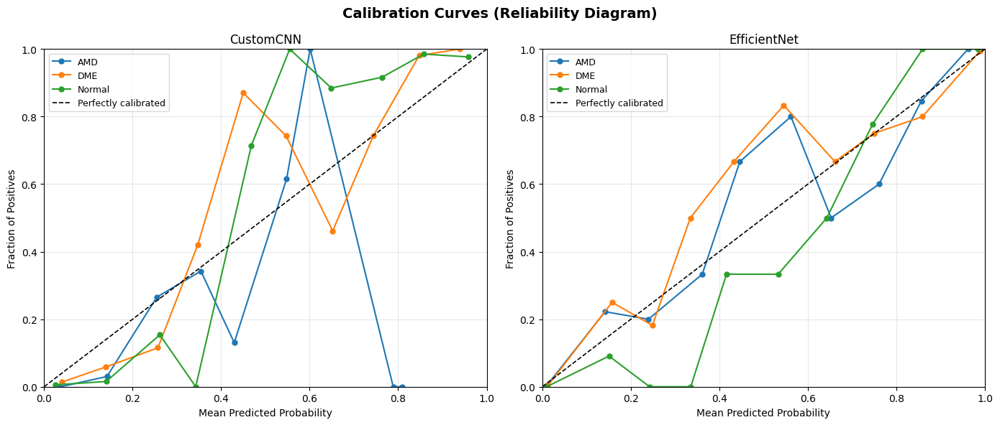

In [104]:
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
fig.suptitle('Calibration Curves (Reliability Diagram)', fontsize=14, fontweight='bold')

for ax, (name, (y_true, y_pred, y_probs)) in zip(axes, results.items()):
    y_bin = label_binarize(y_true, classes=range(len(class_names)))

    for i, cls in enumerate(class_names):
        prob_true, prob_pred = calibration_curve(
            y_bin[:, i], y_probs[:, i], n_bins=10, strategy='uniform'
        )
        ax.plot(prob_pred, prob_true, marker='o', linewidth=1.5,
                label=cls, markersize=5)

    ax.plot([0, 1], [0, 1], 'k--', linewidth=1.2, label='Perfectly calibrated')
    ax.set_xlabel('Mean Predicted Probability')
    ax.set_ylabel('Fraction of Positives')
    ax.set_title(name)
    ax.legend(fontsize=9)
    ax.grid(alpha=0.3)
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)

plt.tight_layout()
plt.show()

In [105]:
def bootstrap_ci(y_true, y_pred, y_probs, n_bootstrap=1000, ci=95):
    accs, aucs = [], []
    y_bin = label_binarize(y_true, classes=range(len(class_names)))

    for _ in range(n_bootstrap):
        idx = resample(range(len(y_true)), replace=True, random_state=None)
        acc = (y_true[idx] == y_pred[idx]).mean()
        try:
            auc_val = roc_auc_score(y_bin[idx], y_probs[idx], multi_class='ovr',
                                    average='macro')
        except ValueError:
            continue
        accs.append(acc)
        aucs.append(auc_val)

    alpha = (100 - ci) / 2
    return {
        'accuracy': (np.mean(accs),
                     np.percentile(accs, alpha),
                     np.percentile(accs, 100 - alpha)),
        'macro_auc': (np.mean(aucs),
                      np.percentile(aucs, alpha),
                      np.percentile(aucs, 100 - alpha)),
    }

print('Bootstrap 95% CI (1000 iterazioni):')
for name, (y_true, y_pred, y_probs) in results.items():
    ci = bootstrap_ci(y_true, y_pred, y_probs)
    print(f'\n{name}:')
    m, lo, hi = ci['accuracy']
    print(f'  Accuracy:   {m:.3f}  [{lo:.3f}, {hi:.3f}]')
    m, lo, hi = ci['macro_auc']
    print(f'  Macro-AUC:  {m:.3f}  [{lo:.3f}, {hi:.3f}]')

Bootstrap 95% CI (1000 iterazioni):

CustomCNN:
  Accuracy:   0.854  [0.825, 0.882]
  Macro-AUC:  0.917  [0.900, 0.934]

EfficientNet:
  Accuracy:   0.957  [0.940, 0.973]
  Macro-AUC:  0.995  [0.992, 0.998]


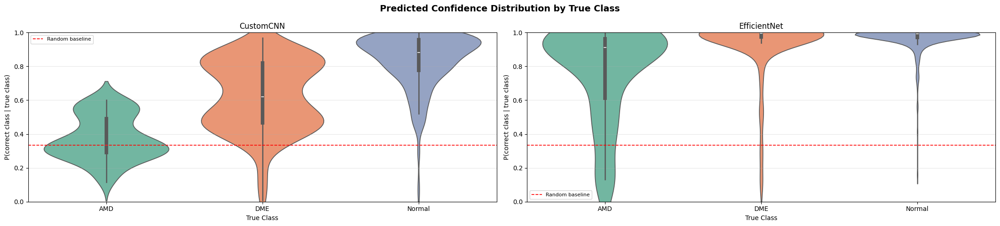

In [106]:
fig, axes = plt.subplots(1, 2, figsize=(22, 5))
fig.suptitle('Predicted Confidence Distribution by True Class', fontsize=14, fontweight='bold')

for ax, (name, (y_true, y_pred, y_probs)) in zip(axes, results.items()):
    rows = []
    for i, cls in enumerate(class_names):
        mask = y_true == i
        for prob in y_probs[mask, i]:
            rows.append({'True Class': cls, 'Confidence': prob})

    df_conf = pd.DataFrame(rows)

    sns.violinplot(data=df_conf, x='True Class', y='Confidence',
                   palette='Set2', inner='box', ax=ax)
    ax.axhline(1 / len(class_names), color='red', linestyle='--',
               linewidth=1.2, label='Random baseline')
    ax.set_title(name)
    ax.set_ylim(0, 1)
    ax.set_ylabel('P(correct class | true class)')
    ax.legend(fontsize=8)
    ax.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

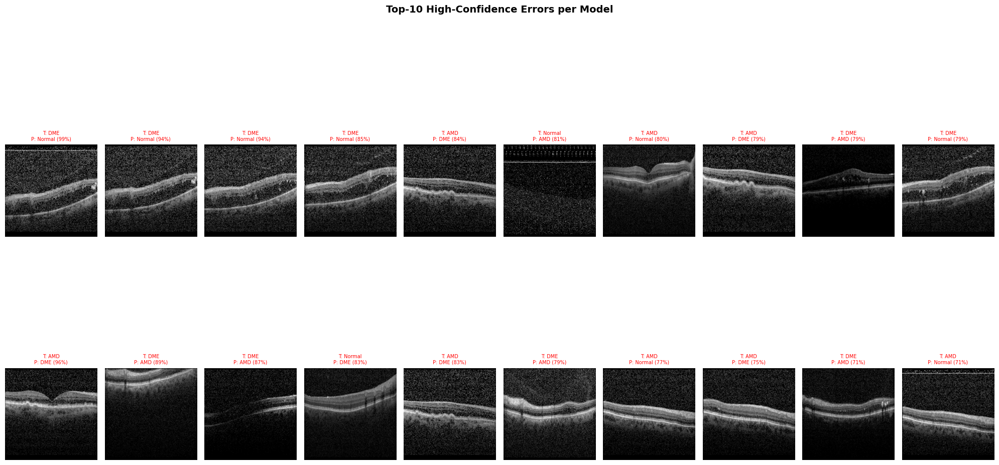

In [107]:
K = 10

fig, axes = plt.subplots(2, K, figsize=(20, 12))
fig.suptitle(f'Top-{K} High-Confidence Errors per Model', fontsize=14, fontweight='bold')

for row, (name, model) in enumerate(models_dict.items()):
    model.eval()

    errors = []
    img_paths = df_test['path'].reset_index(drop=True)
    idx_global = 0

    with torch.no_grad():
        for imgs, labels in test_loader:
            imgs_dev = imgs.to(DEVICE)
            outputs  = model(imgs_dev)
            probs    = torch.softmax(outputs, dim=1).cpu().numpy()
            preds    = probs.argmax(axis=1)

            for i in range(len(labels)):
                true  = labels[i].item()
                pred  = preds[i]
                conf  = probs[i, pred]
                if pred != true:
                    errors.append({
                        'path':      img_paths[idx_global],
                        'true':      true,
                        'pred':      pred,
                        'conf':      conf,
                        'img_tensor': imgs[i]
                    })
                idx_global += 1

    errors = sorted(errors, key=lambda x: x['conf'], reverse=True)[:K]

    for col, err in enumerate(errors):
        img_vis = (err['img_tensor'].squeeze() * 0.5 + 0.5).clamp(0, 1).numpy()
        axes[row, col].imshow(img_vis, cmap='gray')
        axes[row, col].set_title(
            f"T: {inverse_mapping[err['true']]}\nP: {inverse_mapping[err['pred']]} ({err['conf']:.0%})",
            fontsize=7, color='red'
        )
        axes[row, col].axis('off')

    axes[row, 0].set_ylabel(name, fontsize=11, fontweight='bold', labelpad=10)

plt.tight_layout()
plt.show()

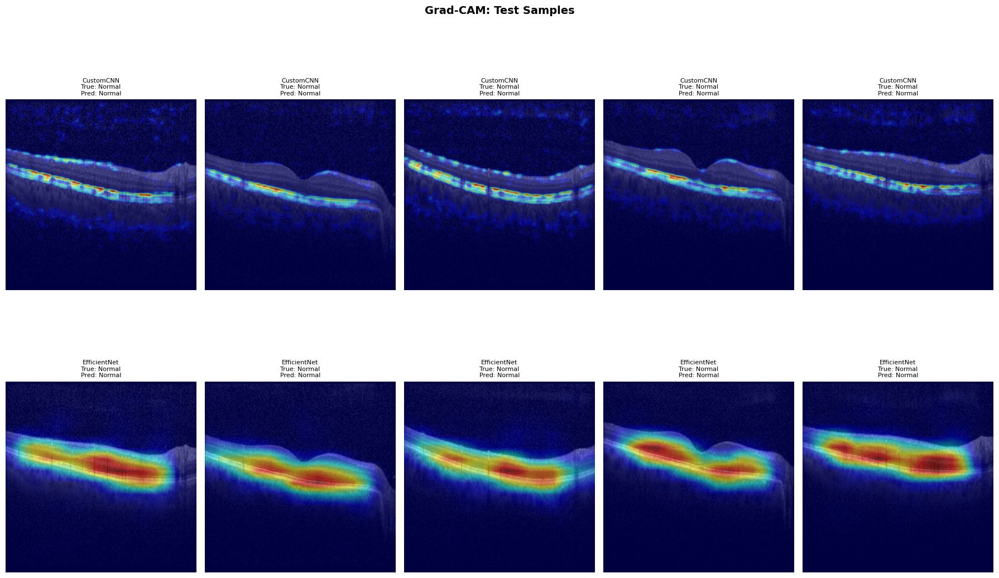

In [108]:
def get_target_layer(model, name):
    if name == 'CustomCNN':
        return [model.features[-4]]
    else:
        return [model.base.features[-1]]

fig, axes = plt.subplots(2, 5, figsize=(18, 12))
fig.suptitle('Grad-CAM: Test Samples', fontsize=14, fontweight='bold')

for row, (name, model) in enumerate(models_dict.items()):
    model.eval()
    
    cam = GradCAM(model=model, target_layers=get_target_layer(model, name))
    samples_shown = 0

    for imgs, labels in test_loader:
        for i in range(len(imgs)):
            if samples_shown >= 5:
                break

            img_tensor = imgs[i].unsqueeze(0).to(DEVICE)

            with torch.no_grad():
                output = model(img_tensor)
                pred_class = output.argmax(dim=1).item()

            targets = [ClassifierOutputTarget(pred_class)]
            grayscale_cam = cam(input_tensor=img_tensor, targets=targets)[0]

            img_np = imgs[i].squeeze().cpu().numpy()
            img_np = (img_np * 0.5 + 0.5).clip(0, 1)
            img_rgb = np.stack([img_np] * 3, axis=-1)

            visualization = show_cam_on_image(img_rgb, grayscale_cam, use_rgb=True)

            axes[row, samples_shown].imshow(visualization)
            axes[row, samples_shown].set_title(
                f"{name}\nTrue: {inverse_mapping[labels[i].item()]}\nPred: {inverse_mapping[pred_class]}", 
                fontsize=8
            )
            axes[row, samples_shown].axis('off')

            samples_shown += 1

        if samples_shown >= 5:
            break

    cam = None

plt.tight_layout()
plt.show()

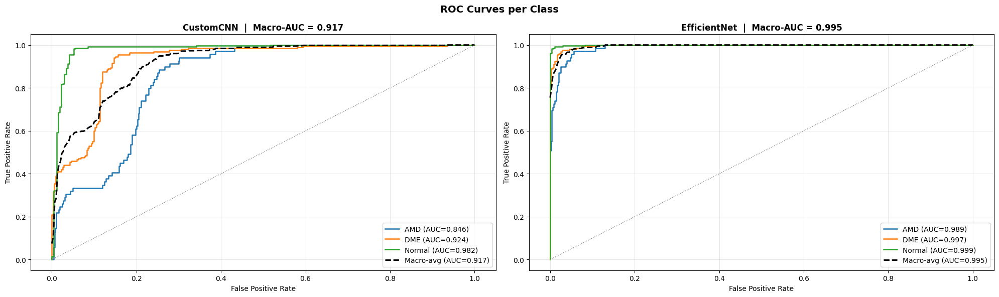

In [109]:
fig, axes = plt.subplots(1, 2, figsize=(20, 6))
fig.suptitle('ROC Curves per Class', fontsize=14, fontweight='bold')

for ax, (name, (y_true, y_pred, y_probs)) in zip(axes, results.items()):
    y_bin = label_binarize(y_true, classes=range(len(class_names)))
    all_fpr = np.linspace(0, 1, 300)
    mean_tpr = np.zeros_like(all_fpr)

    for i, cls in enumerate(class_names):
        fpr, tpr, _ = roc_curve(y_bin[:, i], y_probs[:, i])
        auc_val = auc(fpr, tpr)
        ax.plot(fpr, tpr, linewidth=1.8, label=f'{cls} (AUC={auc_val:.3f})')
        mean_tpr += np.interp(all_fpr, fpr, tpr)

    # Macro-average ROC
    mean_tpr /= len(class_names)
    macro_auc = auc(all_fpr, mean_tpr)
    ax.plot(all_fpr, mean_tpr, 'k--', linewidth=2.2,
            label=f'Macro-avg (AUC={macro_auc:.3f})')

    ax.plot([0,1],[0,1], color='gray', linestyle=':', linewidth=1)
    ax.set_title(f'{name}  |  Macro-AUC = {macro_auc:.3f}', fontweight='bold')
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.legend(fontsize=10)
    ax.grid(alpha=0.3)

plt.tight_layout()
plt.show()

------------------------------------

True label: Normal



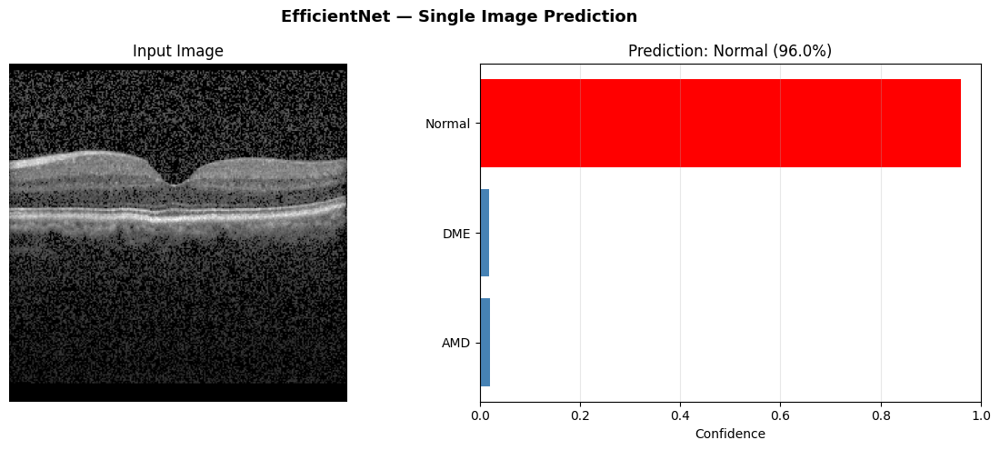

Predicted class : Normal
  AMD       : 2.0%
  DME       : 1.9%
  Normal    : 96.0%


In [110]:
def predict_single_image(img_path, model, model_name,
                         transforms=val_test_transforms,
                         names=class_names,
                         inv_map=inverse_mapping):
    model.eval()

    img = Image.open(img_path).convert('L')
    img_resized = img.resize((512, 512), Image.Resampling.LANCZOS)
    img_tensor = torch.tensor(np.array(img_resized, dtype=np.float32) / 255.0)
    img_tensor = img_tensor.unsqueeze(0).unsqueeze(0)
    img_tensor = val_test_transforms(img_tensor).to(DEVICE)

    with torch.no_grad():
        outputs = model(img_tensor)
        probs = torch.softmax(outputs, dim=1).cpu().numpy()[0]
        pred_idx = np.argmax(probs)

    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    fig.suptitle(f'{model_name} — Single Image Prediction', fontsize=13, fontweight='bold')

    axes[0].imshow(img_resized, cmap='gray')
    axes[0].set_title('Input Image')
    axes[0].axis('off')

    colors = ['red' if i == pred_idx else 'steelblue' for i in range(len(class_names))]
    axes[1].barh(class_names, probs, color=colors)
    axes[1].set_xlim(0, 1)
    axes[1].set_xlabel('Confidence')
    axes[1].set_title(f'Prediction: {inverse_mapping[pred_idx]} ({probs[pred_idx]*100:.1f}%)')
    axes[1].grid(axis='x', alpha=0.3)

    plt.tight_layout()
    plt.show()

    print(f"Predicted class : {inverse_mapping[pred_idx]}")
    for i, cls in enumerate(class_names):
        print(f"  {cls:10s}: {probs[i]*100:.1f}%")


# Test on a random image from the test set
sample_row = df_test.sample(1).iloc[0]
test_sample_path = sample_row['path']
true_label       = sample_row['label_clean']

print(f"True label: {true_label}\n")
predict_single_image(test_sample_path, models_dict['EfficientNet'], 'EfficientNet')

---------------------------------------------

&nbsp;

## **9. Out-of-Distribution Detection: Glaucoma**

I test the robustness of both models by feeding them 100 glaucoma OCT images, a pathology neither model has seen during training. Since both models are closed world classifiers (AMD, DME, or Normal), they will always assign one of the three labels regardless of what they actually see. My goal is to measure how confident each model is on these unknown cases, and to check whether a simple confidence threshold can flag them as suspicious.

Glaucoma OOD images found: 100


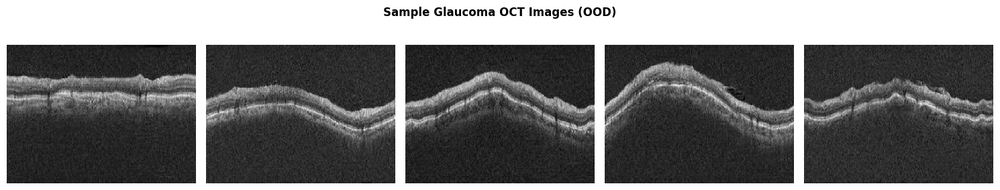

In [111]:
GLAUCOMA_DIR = '/kaggle/input/datasets/susannamazzocchi/dataset-glaucoma/glaucoma_dataset'

glaucoma_imgs = sorted(
    glob.glob(GLAUCOMA_DIR + "/*.jpg") +
    glob.glob(GLAUCOMA_DIR + "/*.png") +
    glob.glob(GLAUCOMA_DIR + "/*.jpeg")
)
print(f"Glaucoma OOD images found: {len(glaucoma_imgs)}")

# Preview
fig, axes = plt.subplots(1, 5, figsize=(15, 3))
fig.suptitle('Sample Glaucoma OCT Images (OOD)', fontsize=12, fontweight='bold')
for ax, path in zip(axes, random.sample(glaucoma_imgs, 5)):
    ax.imshow(Image.open(path).convert('L'), cmap='gray')
    ax.axis('off')
plt.tight_layout()
plt.show()

### ***OODDataset and DataLoader***

In [112]:
class OODDataset(Dataset):
    def __init__(self, img_paths, transform=None):
        self.paths = img_paths
        self.transform = transform

    def __len__(self):
        return len(self.paths)

    def __getitem__(self, idx):
        img = Image.open(self.paths[idx]).convert('L')
        img = img.resize((512, 512), Image.Resampling.LANCZOS)
        img = np.array(img, dtype=np.float32) / 255.0
        img = torch.tensor(img).unsqueeze(0)
        if self.transform:
            img = self.transform(img)
        return img

glaucoma_dataset_ood = OODDataset(glaucoma_imgs, transform=val_test_transforms)
glaucoma_loader      = DataLoader(glaucoma_dataset_ood, batch_size=32,
                                  shuffle=False, num_workers=2,
                                  pin_memory=torch.cuda.is_available())
print(f"OOD loader ready --> {len(glaucoma_dataset_ood)} images")

OOD loader ready --> 100 images


In [113]:
OOD_THRESHOLD = 0.65

def get_ood_predictions(model, loader):
    model.eval()
    all_preds, all_probs = [], []
    with torch.no_grad():
        for imgs in loader:
            imgs = imgs.to(DEVICE)
            outputs = model(imgs)
            probs   = torch.softmax(outputs, dim=1).cpu().numpy()
            all_preds.append(probs.argmax(axis=1))
            all_probs.append(probs)
    preds = np.concatenate(all_preds)
    probs = np.concatenate(all_probs)
    return preds, probs, probs.max(axis=1)

ood_results = {}
for name, model in models_dict.items():
    preds, probs, max_conf = get_ood_predictions(model, glaucoma_loader)
    ood_results[name] = {'preds': preds, 'probs': probs, 'max_conf': max_conf}

    print(f"\n{'─'*45}")
    print(f"  {name} — Glaucoma predictions")
    print(f"{'─'*45}")
    for i, cls in enumerate(class_names):
        count = (preds == i).sum()
        print(f"  {cls:10s}: {count:3d}  ({count/len(preds)*100:.1f}%)")
    print(f"  Mean max confidence : {max_conf.mean():.3f}")
    print(f"  Flagged uncertain   : {(max_conf < OOD_THRESHOLD).sum()}/{len(max_conf)}"
          f" ({(max_conf < OOD_THRESHOLD).mean()*100:.1f}%)  [threshold={OOD_THRESHOLD}]")


─────────────────────────────────────────────
  CustomCNN — Glaucoma predictions
─────────────────────────────────────────────
  AMD       :   0  (0.0%)
  DME       : 100  (100.0%)
  Normal    :   0  (0.0%)
  Mean max confidence : 0.988
  Flagged uncertain   : 0/100 (0.0%)  [threshold=0.65]

─────────────────────────────────────────────
  EfficientNet — Glaucoma predictions
─────────────────────────────────────────────
  AMD       :  43  (43.0%)
  DME       :  57  (57.0%)
  Normal    :   0  (0.0%)
  Mean max confidence : 0.701
  Flagged uncertain   : 42/100 (42.0%)  [threshold=0.65]


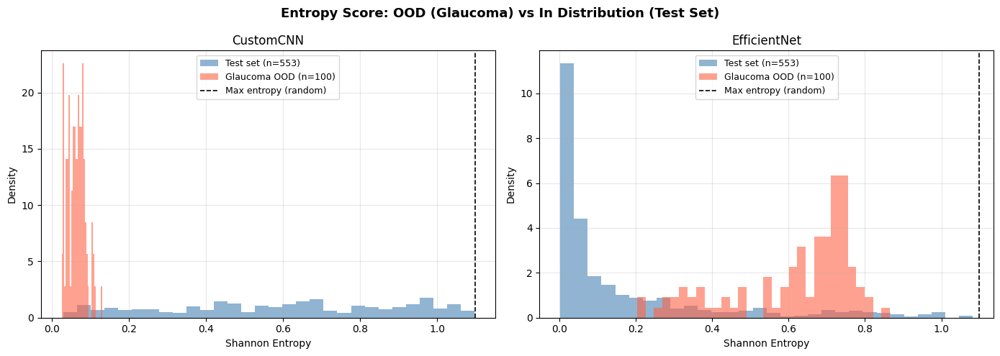

CustomCNN:
  Test set   mean entropy: 0.597
  Glaucoma   mean entropy: 0.063
  Flagged OOD (ent > 0.33): 0/100
EfficientNet:
  Test set   mean entropy: 0.166
  Glaucoma   mean entropy: 0.617
  Flagged OOD (ent > 0.39): 84/100


In [114]:
def entropy_score(probs):
    """
    High entropy = the model is uncertain (OOD).
    Low entropy = the model is confident (in distribution).
    Theoretical max for 3 classes = log(3) ~ 1.099
    """
    return scipy.stats.entropy(probs, axis=1)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('Entropy Score: OOD (Glaucoma) vs In Distribution (Test Set)',
             fontsize=13, fontweight='bold')

for ax, name in zip(axes, models_dict):
    # In distribution: test set
    y_true_test, _, probs_test = results[name]
    ent_test = entropy_score(probs_test)

    # OOD: glaucoma
    probs_ood = ood_results[name]['probs']
    ent_ood   = entropy_score(probs_ood)

    ax.hist(ent_test, bins=30, alpha=0.6, color='steelblue',
            label=f'Test set (n={len(ent_test)})',  density=True)
    ax.hist(ent_ood,  bins=30, alpha=0.6, color='tomato',
            label=f'Glaucoma OOD (n={len(ent_ood)})', density=True)
    ax.axvline(np.log(3), color='black', linestyle='dashed', linewidth=1.2,
               label='Max entropy (random)')
    ax.set_title(name)
    ax.set_xlabel('Shannon Entropy')
    ax.set_ylabel('Density')
    ax.legend(fontsize=9)
    ax.grid(alpha=0.3)

plt.tight_layout()
plt.show()

for name in models_dict:
    _, _, probs_test = results[name]
    probs_ood = ood_results[name]['probs']
    ent_test = entropy_score(probs_test)
    ent_ood  = entropy_score(probs_ood)
    print(f'{name}:')
    print(f'  Test set   mean entropy: {ent_test.mean():.3f}')
    print(f'  Glaucoma   mean entropy: {ent_ood.mean():.3f}')
    thresh = (ent_test.mean() + ent_ood.mean()) / 2
    flagged = (ent_ood > thresh).sum()
    print(f'  Flagged OOD (ent > {thresh:.2f}): {flagged}/100')

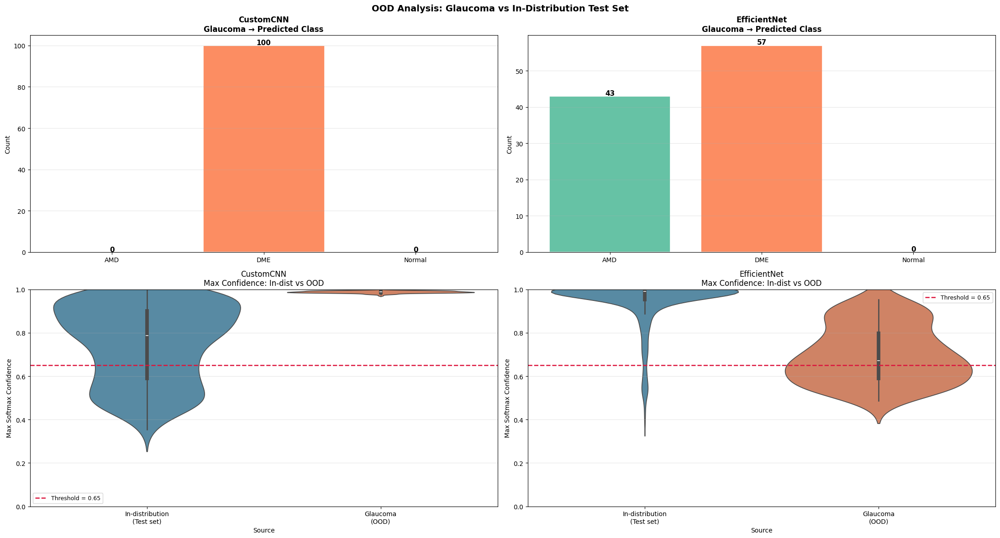

In [115]:
fig, axes = plt.subplots(2, 2, figsize=(22, 12))
fig.suptitle('OOD Analysis: Glaucoma vs In-Distribution Test Set', fontsize=14, fontweight='bold')

for col, name in enumerate(models_dict):
    preds    = ood_results[name]['preds']
    max_conf = ood_results[name]['max_conf']
    counts = [int((preds == i).sum()) for i in range(len(class_names))]
    bars = axes[0, col].bar(class_names, counts,
                            color=sns.color_palette('Set2', len(class_names)),
                            edgecolor='white', linewidth=1.2)
    axes[0, col].set_title(f'{name}\nGlaucoma → Predicted Class', fontweight='bold')
    axes[0, col].set_ylabel('Count')
    axes[0, col].grid(axis='y', alpha=0.3)
    for bar, v in zip(bars, counts):
        axes[0, col].text(bar.get_x() + bar.get_width()/2, v + 0.3,
                          str(v), ha='center', fontsize=11, fontweight='bold')

    _, _, in_dist_max_conf = results[name]         
    in_dist_max_conf_arr = in_dist_max_conf if isinstance(in_dist_max_conf, np.ndarray) \
                           else results[name][2].max(axis=1)
    in_conf = results[name][2].max(axis=1)

    df_conf_plot = pd.DataFrame({
        'Max Confidence': np.concatenate([in_conf, max_conf]),
        'Source': ['In-distribution\n(Test set)'] * len(in_conf) +
                  ['Glaucoma\n(OOD)']             * len(max_conf)
    })

    sns.violinplot(data=df_conf_plot, x='Source', y='Max Confidence',
                   palette={'In-distribution\n(Test set)': '#4C8EAF',
                             'Glaucoma\n(OOD)':            '#E07B54'},
                   inner='box', ax=axes[1, col])
    axes[1, col].axhline(OOD_THRESHOLD, color='crimson', linestyle='--',
                         linewidth=1.8, label=f'Threshold = {OOD_THRESHOLD}')
    axes[1, col].set_title(f'{name}\nMax Confidence: In-dist vs OOD')
    axes[1, col].set_ylabel('Max Softmax Confidence')
    axes[1, col].set_ylim(0, 1)
    axes[1, col].legend(fontsize=9)
    axes[1, col].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

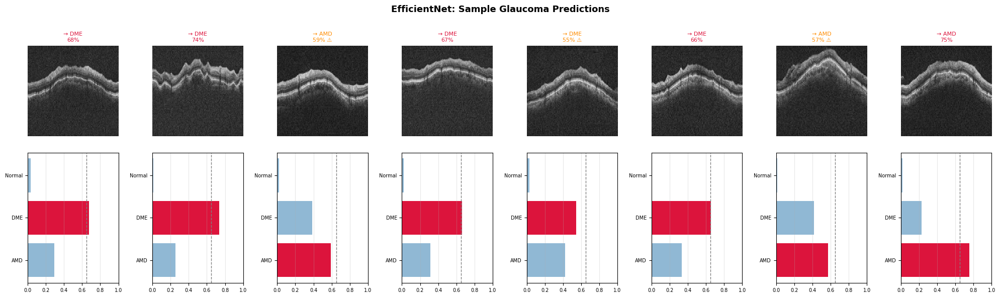

In [116]:
N_SHOW = 8
sample_idxs = random.sample(range(len(glaucoma_imgs)), min(N_SHOW, len(glaucoma_imgs)))

model_ood = models_dict['EfficientNet']
model_ood.eval()

fig, axes = plt.subplots(2, N_SHOW, figsize=(20, 6))
fig.suptitle('EfficientNet: Sample Glaucoma Predictions', fontsize=13, fontweight='bold')

for col, idx in enumerate(sample_idxs):
    path    = glaucoma_imgs[idx]
    img_raw = Image.open(path).convert('L').resize((512, 512), Image.Resampling.LANCZOS)
    t = torch.tensor(np.array(img_raw, dtype=np.float32) / 255.0).unsqueeze(0).unsqueeze(0)
    t = val_test_transforms(t).to(DEVICE)

    with torch.no_grad():
        probs    = torch.softmax(model_ood(t), dim=1).cpu().numpy()[0]
        pred_idx = int(np.argmax(probs))
        conf     = probs[pred_idx]

    flag  = " ⚠️" if conf < OOD_THRESHOLD else ""
    tcolor = 'darkorange' if conf < OOD_THRESHOLD else 'crimson'

    axes[0, col].imshow(np.array(img_raw), cmap='gray')
    axes[0, col].axis('off')
    axes[0, col].set_title(f"→ {class_names[pred_idx]}\n{conf:.0%}{flag}",
                           fontsize=8, color=tcolor)

    bar_colors = ['crimson' if i == pred_idx else '#90b8d4'
                  for i in range(len(class_names))]
    axes[1, col].barh(class_names, probs, color=bar_colors)
    axes[1, col].axvline(OOD_THRESHOLD, color='gray', linestyle='--', linewidth=1)
    axes[1, col].set_xlim(0, 1)
    axes[1, col].tick_params(labelsize=7)
    axes[1, col].grid(axis='x', alpha=0.3)

plt.tight_layout()
plt.show()

In [117]:
print(f"\n{'═'*58}")
print(f"{'OOD FLAGGING SUMMARY: GLAUCOMA (100 images)':^58}")
print(f"{'═'*58}")
print(f"  {'Threshold':<15} {'CustomCNN':^18} {'EfficientNet':^18}")
print(f"  {'─'*53}")

for thresh in [0.60, 0.70, 0.80, 0.90]:
    row = f"  conf < {thresh:.2f}      "
    for name in models_dict:
        mc       = ood_results[name]['max_conf']
        flagged  = int((mc < thresh).sum())
        pct      = flagged / len(mc) * 100
        row     += f"  {flagged:3d}/{len(mc)} ({pct:4.1f}%)   "
    print(row)

print(f"{'═'*58}")
print("\n★ Flagged = images the model considers 'uncertain'")
print(f"  → would be sent to specialist instead of auto-diagnosed")


══════════════════════════════════════════════════════════
       OOD FLAGGING SUMMARY: GLAUCOMA (100 images)        
══════════════════════════════════════════════════════════
  Threshold           CustomCNN         EfficientNet   
  ─────────────────────────────────────────────────────
  conf < 0.60          0/100 ( 0.0%)      27/100 (27.0%)   
  conf < 0.70          0/100 ( 0.0%)      56/100 (56.0%)   
  conf < 0.80          0/100 ( 0.0%)      75/100 (75.0%)   
  conf < 0.90          0/100 ( 0.0%)      90/100 (90.0%)   
══════════════════════════════════════════════════════════

★ Flagged = images the model considers 'uncertain'
  → would be sent to specialist instead of auto-diagnosed


In [118]:
# Temperature Scaling — CustomCNN and EfficientNet
def find_temperature(model, loader, T_range=(0.5, 5.0), steps=100):
    model.eval()
    all_logits, all_labels = [], []
    with torch.no_grad():
        for imgs, labels in loader:
            imgs, labels = imgs.to(DEVICE), labels.to(DEVICE)
            logits = model(imgs)
            all_logits.append(logits.cpu())
            all_labels.append(labels.cpu())
    all_logits = torch.cat(all_logits)
    all_labels = torch.cat(all_labels)

    best_T, best_nll = 1.0, float('inf')
    for T in np.linspace(T_range[0], T_range[1], steps):
        nll = nn.CrossEntropyLoss()(all_logits / T, all_labels).item()
        if nll < best_nll:
            best_nll, best_T = nll, T
    return best_T

temperatures = {}
for name, model in models_dict.items():
    T = find_temperature(model, val_loader)
    temperatures[name] = T
    print(f"{name:<15} Best Temperature: {T:.3f}")

CustomCNN       Best Temperature: 0.591
EfficientNet    Best Temperature: 1.318


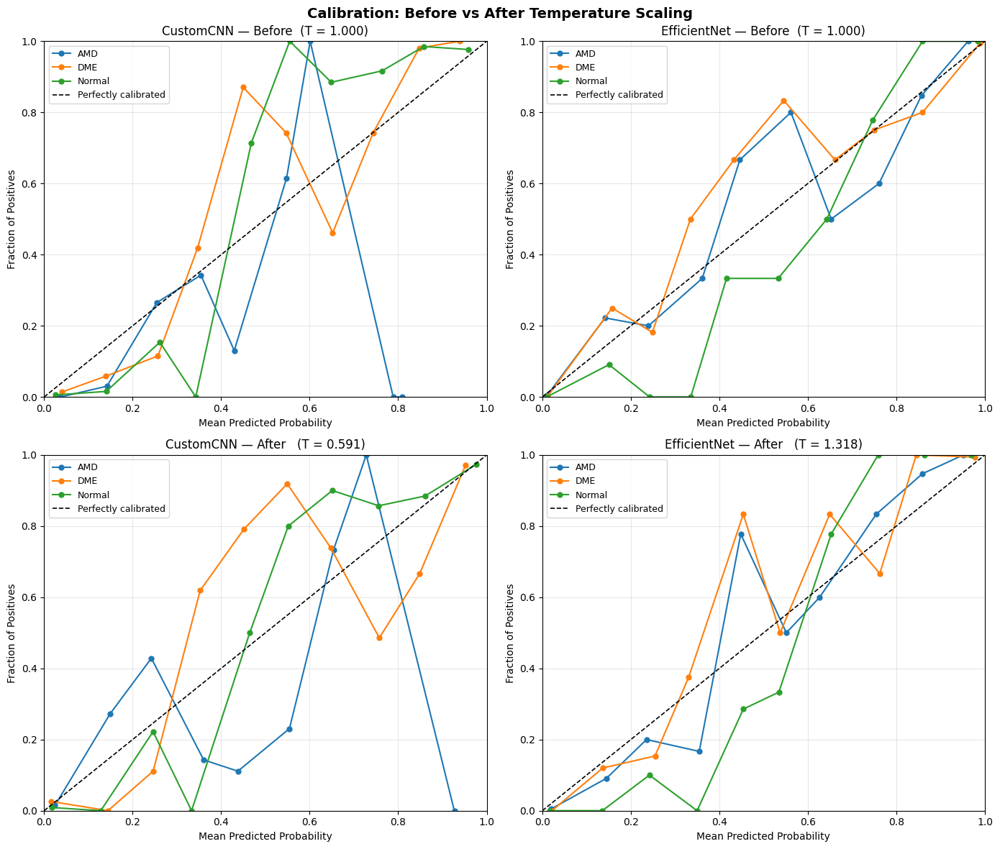

In [119]:
# Calibration Before vs After Temperature Scaling
from sklearn.calibration import calibration_curve

def get_calibrated_probs(model, loader, T=1.0):
    model.eval()
    all_probs, all_labels = [], []
    with torch.no_grad():
        for imgs, labels in loader:
            imgs = imgs.to(DEVICE)
            logits = model(imgs) / T
            probs = torch.softmax(logits, dim=1).cpu().numpy()
            all_probs.append(probs)
            all_labels.extend(labels.numpy())
    return np.concatenate(all_probs), np.array(all_labels)

fig, axes = plt.subplots(2, 2, figsize=(14, 12))
fig.suptitle('Calibration: Before vs After Temperature Scaling', fontsize=14, fontweight='bold')

for col, (name, model) in enumerate(models_dict.items()):
    T = temperatures[name]
    y_true, _, probs_before = results[name]
    probs_after, _          = get_calibrated_probs(model, test_loader, T=T)
    y_bin = label_binarize(y_true, classes=range(len(class_names)))

    for row, (probs, subtitle) in enumerate([
        (probs_before, f'Before  (T = 1.000)'),
        (probs_after,  f'After   (T = {T:.3f})')
    ]):
        ax = axes[row, col]
        for i, cls in enumerate(class_names):
            prob_true, prob_pred = calibration_curve(
                y_bin[:, i], probs[:, i], n_bins=10, strategy='uniform'
            )
            ax.plot(prob_pred, prob_true, marker='o', linewidth=1.5,
                    label=cls, markersize=5)
        ax.plot([0, 1], [0, 1], 'k--', linewidth=1.2, label='Perfectly calibrated')
        ax.set_title(f'{name} — {subtitle}')
        ax.set_xlabel('Mean Predicted Probability')
        ax.set_ylabel('Fraction of Positives')
        ax.legend(fontsize=9)
        ax.grid(alpha=0.3)
        ax.set_xlim(0, 1); ax.set_ylim(0, 1)

plt.tight_layout()
plt.show()

In [120]:
# OOD Entropy with Temperature Scaling
def get_ood_entropy(model, loader, T=1.0):
    model.eval()
    all_probs = []
    with torch.no_grad():
        for imgs in loader:
            imgs = imgs.to(DEVICE)
            probs = torch.softmax(model(imgs) / T, dim=1).cpu().numpy()
            all_probs.append(probs)
    probs = np.concatenate(all_probs)
    return probs, scipy_entropy(probs.T)

def get_indist_entropy(model, loader, T=1.0):
    model.eval()
    all_probs = []
    with torch.no_grad():
        for imgs, _ in loader:      
            imgs = imgs.to(DEVICE)
            probs = torch.softmax(model(imgs) / T, dim=1).cpu().numpy()
            all_probs.append(probs)
    probs = np.concatenate(all_probs)
    return probs, scipy_entropy(probs.T)

entropy_thresholds = {}
ent_val_dict       = {}
ent_ood_dict       = {}

for name, model in models_dict.items():
    T = temperatures[name]
    _, ent_val = get_indist_entropy(model, val_loader, T=T)
    _, ent_ood = get_ood_entropy(model, glaucoma_loader, T=T)

    threshold = (ent_val.mean() + ent_ood.mean()) / 2
    flagged   = int((ent_ood > threshold).sum())

    entropy_thresholds[name] = threshold
    ent_val_dict[name]       = ent_val
    ent_ood_dict[name]       = ent_ood

    print(f"\n{name}  (T={T:.3f})")
    print(f"  Val entropy mean      : {ent_val.mean():.3f}  ← Validation-based threshold")
    print(f"  Glaucoma entropy mean : {ent_ood.mean():.3f}")
    print(f"  Threshold             : {threshold:.3f}")
    print(f"  Flagged OOD           : {flagged}/100 ({flagged}%)")


CustomCNN  (T=0.591)
  Val entropy mean      : 0.543  ← Validation-based threshold
  Glaucoma entropy mean : 0.005
  Threshold             : 0.274
  Flagged OOD           : 0/100 (0%)

EfficientNet  (T=1.318)
  Val entropy mean      : 0.296  ← Validation-based threshold
  Glaucoma entropy mean : 0.713
  Threshold             : 0.505
  Flagged OOD           : 87/100 (87%)



═════════════════════════════════════════════
         OOD DETECTION AUROC SUMMARY         
═════════════════════════════════════════════
  CustomCNN       AUROC: 0.030
  EfficientNet    AUROC: 0.872
═════════════════════════════════════════════


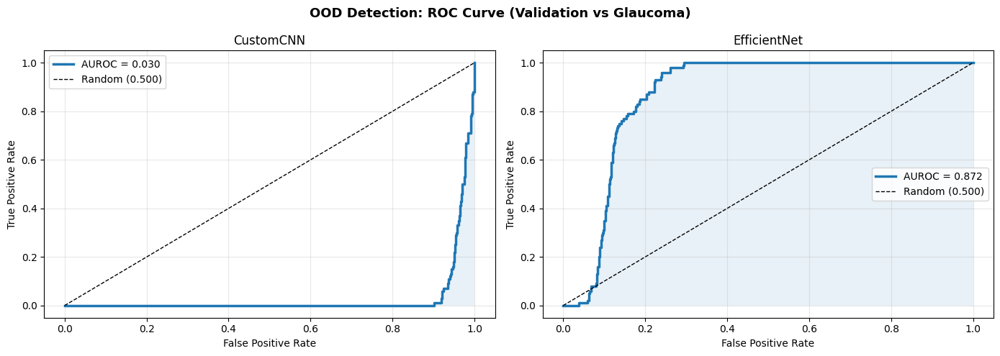

In [121]:
# OOD Detection AUROC

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('OOD Detection: ROC Curve (Validation vs Glaucoma)',
             fontsize=13, fontweight='bold')

print(f"\n{'═'*45}")
print(f"{'OOD DETECTION AUROC SUMMARY':^45}")
print(f"{'═'*45}")

for ax, name in zip(axes, models_dict):
    ent_val = ent_val_dict[name]
    ent_ood = ent_ood_dict[name]

    scores = np.concatenate([ent_val, ent_ood])
    labels = np.concatenate([np.zeros(len(ent_val)), np.ones(len(ent_ood))])

    fpr, tpr, _ = roc_curve(labels, scores)
    auroc        = roc_auc_score(labels, scores)

    ax.plot(fpr, tpr, linewidth=2.5, label=f'AUROC = {auroc:.3f}')
    ax.fill_between(fpr, tpr, alpha=0.10)
    ax.plot([0, 1], [0, 1], 'k--', linewidth=1, label='Random (0.500)')
    ax.set_title(f'{name}')
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.legend(fontsize=10)
    ax.grid(alpha=0.3)

    print(f"  {name:<15} AUROC: {auroc:.3f}")

print(f"{'═'*45}")
plt.tight_layout()
plt.show()

In [122]:
T_efficientnet   = temperatures['EfficientNet']
ENTROPY_THRESHOLD = entropy_thresholds['EfficientNet']

In [123]:
ent_test     = ent_val_dict['EfficientNet']    
ent_glaucoma = ent_ood_dict['EfficientNet']  
flagged      = int((ent_glaucoma > ENTROPY_THRESHOLD).sum())

print(f"\n{'═'*58}")
print(f"{'OOD FINAL SUMMARY: ENTROPY BASED':^58}")
print(f"{'═'*58}")
print(f"  Method: Shannon Entropy (T={T_efficientnet:.3f})")
print(f"  Threshold (auto): {ENTROPY_THRESHOLD:.3f}")
print(f"  ─────────────────────────────────────────────")
print(f"  In-distribution entropy mean:  {ent_test.mean():.3f}")
print(f"  Glaucoma OOD entropy mean:     {ent_glaucoma.mean():.3f}")
print(f"  Flagged as uncertain:          {flagged}/100 ({flagged}%)")
print(f"{'═'*58}")


══════════════════════════════════════════════════════════
             OOD FINAL SUMMARY: ENTROPY BASED             
══════════════════════════════════════════════════════════
  Method: Shannon Entropy (T=1.318)
  Threshold (auto): 0.505
  ─────────────────────────────────────────────
  In-distribution entropy mean:  0.296
  Glaucoma OOD entropy mean:     0.713
  Flagged as uncertain:          87/100 (87%)
══════════════════════════════════════════════════════════


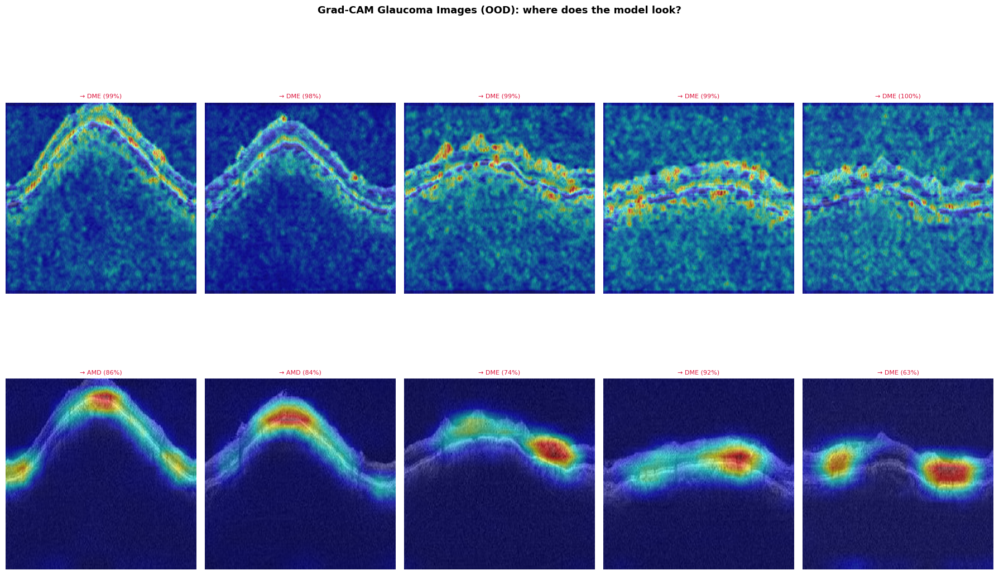

In [124]:
fig, axes = plt.subplots(2, 5, figsize=(18, 12))
fig.suptitle('Grad-CAM Glaucoma Images (OOD): where does the model look?', fontsize=13, fontweight='bold')

cam_paths = random.sample(glaucoma_imgs, 5)

for row, (name, model) in enumerate(models_dict.items()):
    model.eval()
    
    cam = GradCAM(model=model, target_layers=get_target_layer(model, name))

    for col, path in enumerate(cam_paths):
        img_raw = Image.open(path).convert('L').resize((512, 512), Image.Resampling.LANCZOS)
        
        t = torch.tensor(np.array(img_raw, dtype=np.float32) / 255.0).unsqueeze(0).unsqueeze(0)
        t_norm = val_test_transforms(t).to(DEVICE)

        with torch.no_grad():
            probs = torch.softmax(model(t_norm), dim=1).cpu().numpy()[0]
            pred_idx = int(np.argmax(probs))
            conf = probs[pred_idx]
            
        targets = [ClassifierOutputTarget(pred_idx)]
        gc = cam(input_tensor=t_norm, targets=targets)[0]

        img_np = np.array(img_raw, dtype=np.float32) / 255.0
        img_rgb = np.stack([img_np] * 3, axis=-1)
        
        vis = show_cam_on_image(img_rgb, gc, use_rgb=True)

        axes[row, col].imshow(vis)
        axes[row, col].set_title(f"→ {class_names[pred_idx]} ({conf:.0%})", fontsize=8, color='crimson')
        axes[row, col].axis('off')

    axes[row, 0].set_ylabel(name, fontsize=10, fontweight='bold', labelpad=10)

plt.tight_layout()
plt.show()

&nbsp;

## **10. Exporting Models and Configuration for GUI Deployment**

In this final section I export the trained models, their configuration, and the metadata needed to run them inside the ORCA prototype interface.

In [125]:
GUI_DIR = "/kaggle/working/OCT_GUI"
os.makedirs(GUI_DIR, exist_ok=True)


T_efficientnet    = temperatures['EfficientNet']
T_customcnn       = temperatures['CustomCNN']
ENTROPY_THRESHOLD_EFF = entropy_thresholds['EfficientNet']
ENTROPY_THRESHOLD_CNN = entropy_thresholds['CustomCNN']

class_names = [inverse_mapping[i] for i in range(len(class_mapping))]
print(f"Classes: {class_names}")

# Models' weights
for name in models_dict:
    src = f"best_{name}.pth"
    dst = f"{GUI_DIR}/best_{name}.pth"
    if os.path.exists(src):
        shutil.copy(src, dst)
        print(f"✔ Saved model: {dst}")
    else:
        print(f"⚠ Warning: {src} not found: training completed?")


config = {
    "class_mapping":    class_mapping,
    "class_names":      class_names,
    "input_size":       512,
    "normalize_mean":   0.5,
    "normalize_std":    0.5,
    "ood_method":       "entropy",
    "models_available": list(models_dict.keys()),
    "per_model": {
        "EfficientNet": {
            "temperature":     float(T_efficientnet),
            "ood_threshold":   float(ENTROPY_THRESHOLD_EFF),
        },
        "CustomCNN": {
            "temperature":     float(T_customcnn),
            "ood_threshold":   float(ENTROPY_THRESHOLD_CNN),
        }
    }
}

with open(f"{GUI_DIR}/config.json", "w") as f:
    json.dump(config, f, indent=2)
print(f"✔ Saved config.json")

df_test[['path', 'label_clean', 'label_idx', 'patient_id']].to_csv(
    f"{GUI_DIR}/df_test.csv", index=False
)
print(f"✔ Saved df_test.csv ({len(df_test)} rows)")
print(f"\n{'─'*50}")
print(f"Files saved in {GUI_DIR}:")
print(f"{'─'*50}")
for fname in sorted(os.listdir(GUI_DIR)):
    size_mb = os.path.getsize(f"{GUI_DIR}/{fname}") / 1e6
    print(f"  {fname:<40} {size_mb:6.1f} MB")
print(f"{'─'*50}")

Classes: ['AMD', 'DME', 'Normal']
✔ Saved model: /kaggle/working/OCT_GUI/best_CustomCNN.pth
✔ Saved model: /kaggle/working/OCT_GUI/best_EfficientNet.pth
✔ Saved config.json
✔ Saved df_test.csv (553 rows)

──────────────────────────────────────────────────
Files saved in /kaggle/working/OCT_GUI:
──────────────────────────────────────────────────
  best_CustomCNN.pth                          0.4 MB
  best_EfficientNet.pth                      16.3 MB
  config.json                                 0.0 MB
  df_test.csv                                 0.1 MB
  predictions                                 0.0 MB
──────────────────────────────────────────────────


In [126]:
PRED_DIR = "/kaggle/working/OCT_GUI/predictions"
os.makedirs(PRED_DIR, exist_ok=True)

for name, (y_true_m, y_pred_m, y_probs_m) in results.items():
    np.save(f"{PRED_DIR}/{name}_y_true.npy",  y_true_m)
    np.save(f"{PRED_DIR}/{name}_y_pred.npy",  y_pred_m)
    np.save(f"{PRED_DIR}/{name}_y_probs.npy", y_probs_m)
    print(f"✔ {name}: y_true {y_true_m.shape}, y_probs {y_probs_m.shape}")

for name in models_dict:
    T = temperatures[name]
    _, ent_val = get_indist_entropy(models_dict[name], val_loader, T=T)
    _, ent_ood = get_ood_entropy(models_dict[name], glaucoma_loader, T=T)
    np.save(f"{PRED_DIR}/{name}_ent_val.npy", ent_val)
    np.save(f"{PRED_DIR}/{name}_ent_ood.npy", ent_ood)
    print(f"✔ {name}: ent_val {ent_val.shape}, ent_ood {ent_ood.shape}")

import json
meta = {
    "class_names": class_names,
    "temperatures": {k: float(v) for k, v in temperatures.items()},
    "entropy_thresholds": {k: float(v) for k, v in entropy_thresholds.items()},
}
with open(f"{PRED_DIR}/meta.json", "w") as f:
    json.dump(meta, f, indent=2)

print(f"\n✔ Everything saved correctly in {PRED_DIR}")
for fname in sorted(os.listdir(PRED_DIR)):
    size = os.path.getsize(f"{PRED_DIR}/{fname}") / 1e3
    print(f"  {fname:<45} {size:6.1f} KB")

✔ CustomCNN: y_true (553,), y_probs (553, 3)
✔ EfficientNet: y_true (553,), y_probs (553, 3)
✔ CustomCNN: ent_val (585,), ent_ood (100,)
✔ EfficientNet: ent_val (585,), ent_ood (100,)

✔ Everything saved correctly in /kaggle/working/OCT_GUI/predictions
  CustomCNN_ent_ood.npy                            0.5 KB
  CustomCNN_ent_val.npy                            2.5 KB
  CustomCNN_y_pred.npy                             4.6 KB
  CustomCNN_y_probs.npy                            6.8 KB
  CustomCNN_y_true.npy                             4.6 KB
  EfficientNet_ent_ood.npy                         0.5 KB
  EfficientNet_ent_val.npy                         2.5 KB
  EfficientNet_y_pred.npy                          4.6 KB
  EfficientNet_y_probs.npy                         6.8 KB
  EfficientNet_y_true.npy                          4.6 KB
  meta.json                                        0.3 KB
